#**A. Pre-Requisites**

In [ ]:
%%capture
# 1. Kaggle Installation
!pip install kaggle

# 2. Mount Drive
from google.colab import drive
drive.mount('/content/drive')

# 3. Download Kaggle Data directly into Colab
!mkdir ~/.kaggle
!cp /content/drive/MyDrive/COMP700/kaggle.json ~/.kaggle/kaggle.json
!chmod 600 ~/.kaggle/kaggle.json

## Existing Library Versions

In [ ]:
import torch
import torchvision

!python --version
print("PyTorch", torch.__version__)
print("Torchvision", torchvision.__version__)
print("CUDA Availabity:", torch.cuda.is_available())

import tensorflow as tf
# Check the GPU details
gpu_info = tf.config.experimental.list_physical_devices('GPU')
print(gpu_info)

import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

# **B. Install the Required Libraries**

In [ ]:
%%capture

# SAM
!pip install git+https://github.com/facebookresearch/segment-anything.git

# Transformers
!pip install -q git+https://github.com/huggingface/transformers.git

!pip install datasets # to prepare data
!pip install -q monai # to use special loss functions, specifically for medical image applications

!pip install patchify # to divide large images into smaller patches for training (not necessary for smaller images)
!pip install nibabel # to read and write to common neuroimaging file formats e.g. NifTI1, NifTI2 file formats

# **1. Load Data**


# **1.1. Chest X-ray Dataset**

## Download Dataset

In [ ]:
!kaggle datasets download nikhilpandey360/chest-xray-masks-and-labels
!unzip -q chest-xray-masks-and-labels.zip

Dataset URL: https://www.kaggle.com/datasets/nikhilpandey360/chest-xray-masks-and-labels
License(s): CC0-1.0
100% 9.56G/9.58G [02:29<00:00, 145MB/s]
100% 9.58G/9.58G [02:29<00:00, 68.9MB/s]


## Create Dataset

In [ ]:
import os
import numpy as np
from PIL import Image
from patchify import patchify
from datasets import Dataset

# Define paths to the directories containing .PNG images
image_dir = '/content/Lung Segmentation/CXR_png'  # directory with image .png files
mask_dir = '/content/Lung Segmentation/masks'    # directory with mask .png files

# Desired patch size and step size
patch_size = 256
step = 256
resize_to = (256, 256)  # common size used is 256x256 for all images and masks

# Function to load and resize images from a folder
def load_images_from_folder(folder, target_size):
    images = []
    for filename in sorted(os.listdir(folder)):  # Sorting ensures consistent order
        if filename.endswith('.png'):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path).convert('L')  # converts images to grayscale
            img = img.resize(target_size)  # resize image to the target size (256x256)
            img_np = np.array(img)
            images.append(img_np)
    return np.array(images)

# Load and resize images and masks
large_images = load_images_from_folder(image_dir, resize_to)
large_masks = load_images_from_folder(mask_dir, resize_to)

# Check loaded image and mask shapes
print(f"Loaded {large_images.shape[0]} images of shape {large_images.shape[1:]} (HxW)")
print(f"Loaded {large_masks.shape[0]} masks of shape {large_masks.shape[1:]} (HxW)")

# Extract patches for images
all_img_patches = []
for img in range(large_images.shape[0]):
    large_image = large_images[img]
    patches_img = patchify(large_image, (patch_size, patch_size), step=step)  # no overlap

    for i in range(patches_img.shape[0]):
        for j in range(patches_img.shape[1]):
            single_patch_img = patches_img[i, j, :, :]
            all_img_patches.append(single_patch_img)

images = np.array(all_img_patches)

# Extract patches for masks
all_mask_patches = []
for img in range(large_masks.shape[0]):
    large_mask = large_masks[img]
    patches_mask = patchify(large_mask, (patch_size, patch_size), step=step)  # no overlap

    for i in range(patches_mask.shape[0]):
        for j in range(patches_mask.shape[1]):
            single_patch_mask = patches_mask[i, j, :, :]
            single_patch_mask = (single_patch_mask / 255.).astype(np.uint8)  # normalize mask i.e.) 0-1 range
            all_mask_patches.append(single_patch_mask)

masks = np.array(all_mask_patches)

# Filter non-empty masks and corresponding images
valid_indices = [i for i, mask in enumerate(masks) if mask.max() != 0]
filtered_images = images[valid_indices]
filtered_masks = masks[valid_indices]

# Print the shapes of the filtered image and mask arrays
print("Image shape:", filtered_images.shape)  # will be of the form: (num_frames, height, width)
print("Mask shape:", filtered_masks.shape) # will be of the form: (num_frames, height, width)

# Convert the NumPy arrays to Pillow images and store them in a dictionary
dataset_dict = {
    "image": [Image.fromarray(img) for img in filtered_images],
    "label": [Image.fromarray(mask) for mask in filtered_masks],
}

# Create the dataset using the datasets.Dataset class
dataset = Dataset.from_dict(dataset_dict)


Loaded 800 images of shape (256, 256) (HxW)
Loaded 704 masks of shape (256, 256) (HxW)
Image shape: (704, 256, 256)
Mask shape: (704, 256, 256)


In [ ]:
dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 704
})

## Save Dataset

In [ ]:
from google.colab import drive
import numpy as np
import pickle

drive.mount('/content/drive')

# Save as pickle file
with open('/content/drive/MyDrive/COMP700/EfficientSAM/chestxray_dataset.pkl', 'wb') as f:
    pickle.dump(dataset_dict, f)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Load Dataset

In [ ]:
import pickle
from datasets import Dataset
from google.colab import drive

#drive.mount('/content/drive')

# Reload the dataset dictionary from pickle
with open('/content/drive/MyDrive/COMP700/EfficientSAM/chestxray_dataset.pkl', 'rb') as f:
    dataset_dict = pickle.load(f)

# Recreate the Dataset object
dataset = Dataset.from_dict(dataset_dict)

dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 704
})

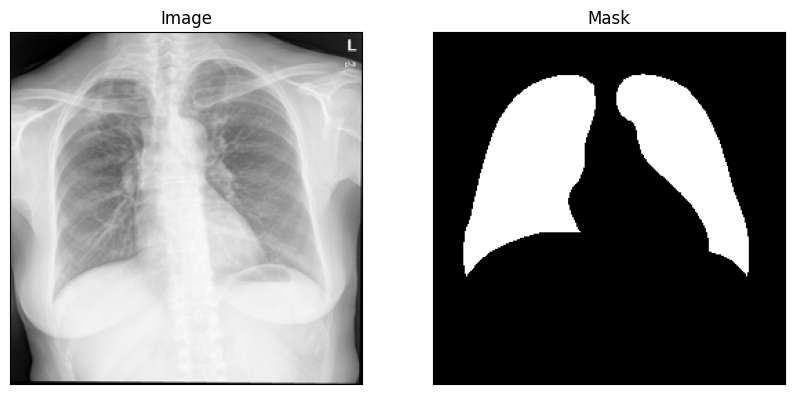

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

img_num = random.randint(0, len(dataset)-1)
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # assuming the first image is grayscale (loading from already converted dataset)
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(example_mask, cmap='gray')  # assuming the second image is grayscale (loading from already converted dataset)
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

# **1.2. Retina Blood Vessel Dataset**

## Download Dataset

In [ ]:
!kaggle datasets download abdallahwagih/retina-blood-vessel
!unzip -q retina-blood-vessel.zip

Dataset URL: https://www.kaggle.com/datasets/abdallahwagih/retina-blood-vessel
License(s): apache-2.0
 70% 23.0M/32.9M [00:00<00:00, 70.1MB/s]
100% 32.9M/32.9M [00:00<00:00, 76.4MB/s]


## Create Dataset

In [ ]:
import os
import numpy as np
from PIL import Image
from patchify import patchify
from datasets import Dataset

# Define paths to the directories containing .PNG images
image_dir = '/content/Data/train/image'  # directory with image .png files
mask_dir = '/content/Data/train/mask'    # directory with mask .png files

# Desired patch size and step size
patch_size = 256
step = 256
resize_to = (256, 256)  # Define a common size for all images and masks

# Function to load and resize images from a folder
def load_images_from_folder(folder, target_size):
    images = []
    for filename in sorted(os.listdir(folder)):  # sorting ensures consistent ordering of images and related masks
        if filename.endswith('.png'):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path).convert('L')  # converts images to grayscale
            img = img.resize(target_size)  # resizes image to the target size (256x256)
            img_np = np.array(img)
            images.append(img_np)
    return np.array(images)

# Load and resize images and masks
large_images = load_images_from_folder(image_dir, resize_to)
large_masks = load_images_from_folder(mask_dir, resize_to)

# Check loaded image and mask shapes
print(f"Loaded {large_images.shape[0]} images of shape {large_images.shape[1:]} (HxW)")
print(f"Loaded {large_masks.shape[0]} masks of shape {large_masks.shape[1:]} (HxW)")

# Extract patches for images
all_img_patches = []
for img in range(large_images.shape[0]):
    large_image = large_images[img]
    patches_img = patchify(large_image, (patch_size, patch_size), step=step)

    for i in range(patches_img.shape[0]):
        for j in range(patches_img.shape[1]):
            single_patch_img = patches_img[i, j, :, :]
            all_img_patches.append(single_patch_img)

images = np.array(all_img_patches)

# Extract patches for masks
all_mask_patches = []
for img in range(large_masks.shape[0]):
    large_mask = large_masks[img]
    patches_mask = patchify(large_mask, (patch_size, patch_size), step=step)

    for i in range(patches_mask.shape[0]):
        for j in range(patches_mask.shape[1]):
            single_patch_mask = patches_mask[i, j, :, :]
            single_patch_mask = (single_patch_mask / 255.).astype(np.uint8)  # normalize mask i.e.) 0-1 range
            all_mask_patches.append(single_patch_mask)

masks = np.array(all_mask_patches)

# Filter non-empty masks and corresponding images
valid_indices = [i for i, mask in enumerate(masks) if mask.max() != 0]
filtered_images = images[valid_indices]
filtered_masks = masks[valid_indices]

# Print the shapes of the filtered image and mask arrays
print("Image shape:", filtered_images.shape)  # of the form: (num_frames, height, width)
print("Mask shape:", filtered_masks.shape)

# Convert the NumPy arrays to Pillow images and store them in a dictionary
dataset_dict = {
    "image": [Image.fromarray(img) for img in filtered_images],
    "label": [Image.fromarray(mask) for mask in filtered_masks],
}

# Create the dataset using the datasets.Dataset class
dataset = Dataset.from_dict(dataset_dict)


Loaded 80 images of shape (256, 256) (HxW)
Loaded 80 masks of shape (256, 256) (HxW)
Image shape: (80, 256, 256)
Mask shape: (80, 256, 256)


In [ ]:
dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 80
})

## Save Dataset

In [ ]:
from google.colab import drive
import numpy as np
import pickle

drive.mount('/content/drive')

# Save as pickle file
with open('/content/drive/MyDrive/COMP700/EfficientSAM/retina_dataset.pkl', 'wb') as f:
    pickle.dump(dataset_dict, f)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Load Dataset

In [ ]:
import pickle
from datasets import Dataset
from google.colab import drive

#drive.mount('/content/drive')

# Reload the dataset dictionary from pickle
with open('/content/drive/MyDrive/COMP700/EfficientSAM/retina_dataset.pkl', 'rb') as f:
    dataset_dict = pickle.load(f)

# Recreate the Dataset object
dataset = Dataset.from_dict(dataset_dict)

dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 80
})

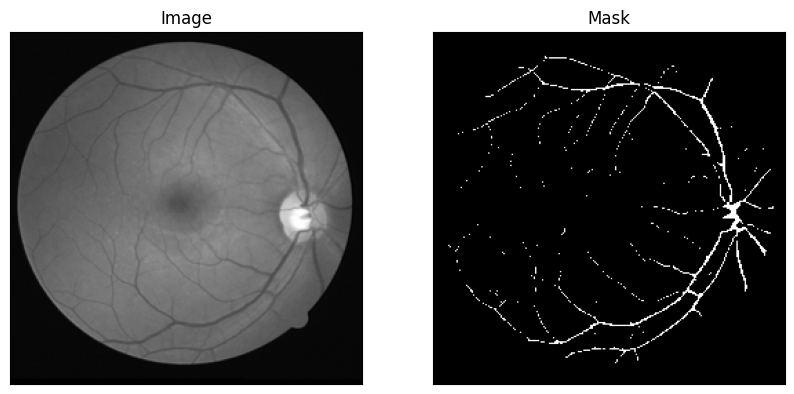

In [ ]:
import random  # Import the random module
import matplotlib.pyplot as plt
import numpy as np

img_num = random.randint(0, len(dataset)-1)
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(example_mask, cmap='gray')  # Assuming the second image is grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

# **1.3. Hi-gMISnet_all Dataset (Medical Image Segmentation Datasets)**
Hi-gMISnet_all_dataset contains:


1.   BUSI (**B**reast **U**ltra**S**ound **I**mages)
2.   CVC_CLINIC_DB (CVC Clinic Database for colonoscopy video analysis)
3.   GLAS (**Gla**nd **S**egmentation - in Colon Histology Images)
4.   ISIC_2018 (**I**nternal **S**kin **I**maging **C**ollaboration 2018)
5.   MoNuSeg (**M**ulti-**O**rgan **Nu**clei **S**egmentation)
6.   Montgomery_County (Montgomery County X-ray Set - for TB Detection)
7.   PROMISE12 (**Pro**state **M**R **I**mage **Se**gmentation)
8.   Physionet_ICH (Physionet **I**ntra**C**ranial **H**emorrhage)



## Download Dataset

In [ ]:
!kaggle datasets download tushartalukder/medical-image-segmentation-datasets-hi-gmisnet
!unzip -q medical-image-segmentation-datasets-hi-gmisnet.zip

Dataset URL: https://www.kaggle.com/datasets/tushartalukder/medical-image-segmentation-datasets-hi-gmisnet
License(s): MIT
100% 1.70G/1.70G [01:46<00:00, 13.4MB/s]
100% 1.70G/1.70G [01:46<00:00, 17.1MB/s]


## **1.3.1. Physionet_ICH Dataset**

### Create the Dataset

In [ ]:
import os
import numpy as np
from PIL import Image
from patchify import patchify
from datasets import Dataset

# Define paths to the directories containing .PNG images
image_dir = '/content/Hi-gMISnet_all_dataset/Physionet_ICH/train/img'  # Directory with image .png files
mask_dir = '/content/Hi-gMISnet_all_dataset/Physionet_ICH/train/label'    # Directory with mask .png files

# Desired patch size and step size
patch_size = 256
step = 256
resize_to = (256, 256)  # Define a common size for all images and masks

# Function to load and resize images from a folder
def load_images_from_folder(folder, target_size):
    images = []
    for filename in sorted(os.listdir(folder)):  # Sorting ensures consistent order
        if filename.endswith('.png'):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path).convert('L')  # Convert to grayscale
            img = img.resize(target_size)  # Resize to the target size
            img_np = np.array(img)
            images.append(img_np)
    return np.array(images)

# Load and resize images and masks
large_images = load_images_from_folder(image_dir, resize_to)
large_masks = load_images_from_folder(mask_dir, resize_to)

# Check loaded image and mask shapes
print(f"Loaded {large_images.shape[0]} images of shape {large_images.shape[1:]} (HxW)")
print(f"Loaded {large_masks.shape[0]} masks of shape {large_masks.shape[1:]} (HxW)")

# Extract patches for images
all_img_patches = []
for img in range(large_images.shape[0]):
    large_image = large_images[img]
    patches_img = patchify(large_image, (patch_size, patch_size), step=step)  # No overlap

    for i in range(patches_img.shape[0]):
        for j in range(patches_img.shape[1]):
            single_patch_img = patches_img[i, j, :, :]
            all_img_patches.append(single_patch_img)

images = np.array(all_img_patches)

# Extract patches for masks
all_mask_patches = []
for img in range(large_masks.shape[0]):
    large_mask = large_masks[img]
    patches_mask = patchify(large_mask, (patch_size, patch_size), step=step)  # No overlap

    for i in range(patches_mask.shape[0]):
        for j in range(patches_mask.shape[1]):
            single_patch_mask = patches_mask[i, j, :, :]
            single_patch_mask = (single_patch_mask / 255.).astype(np.uint8)  # Normalize to 0-1 range
            all_mask_patches.append(single_patch_mask)

masks = np.array(all_mask_patches)

# Filter non-empty masks and corresponding images
valid_indices = [i for i, mask in enumerate(masks) if mask.max() != 0]
filtered_images = images[valid_indices]
filtered_masks = masks[valid_indices]

# Print the shapes of the filtered image and mask arrays
print("Image shape:", filtered_images.shape)  # e.g., (num_frames, height, width)
print("Mask shape:", filtered_masks.shape)

# Convert the NumPy arrays to Pillow images and store them in a dictionary
dataset_dict = {
    "image": [Image.fromarray(img) for img in filtered_images],
    "label": [Image.fromarray(mask) for mask in filtered_masks],
}

# Create the dataset using the datasets.Dataset class
dataset = Dataset.from_dict(dataset_dict)


Loaded 254 images of shape (256, 256) (HxW)
Loaded 254 masks of shape (256, 256) (HxW)
Image shape: (254, 256, 256)
Mask shape: (254, 256, 256)


In [ ]:
dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 254
})

### Save the Dataset

In [ ]:
from google.colab import drive
import numpy as np
import pickle

drive.mount('/content/drive')

# Save as pickle file
with open('/content/drive/MyDrive/COMP700/EfficientSAM/physionet_dataset.pkl', 'wb') as f:
    pickle.dump(dataset_dict, f)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Load the Dataset

In [ ]:
import pickle
from datasets import Dataset
from google.colab import drive

#drive.mount('/content/drive')

# Reload the dataset dictionary from pickle
with open('/content/drive/MyDrive/COMP700/EfficientSAM/physionet_dataset.pkl', 'rb') as f:
    dataset_dict = pickle.load(f)

# Recreate the Dataset object
dataset = Dataset.from_dict(dataset_dict)

dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 254
})

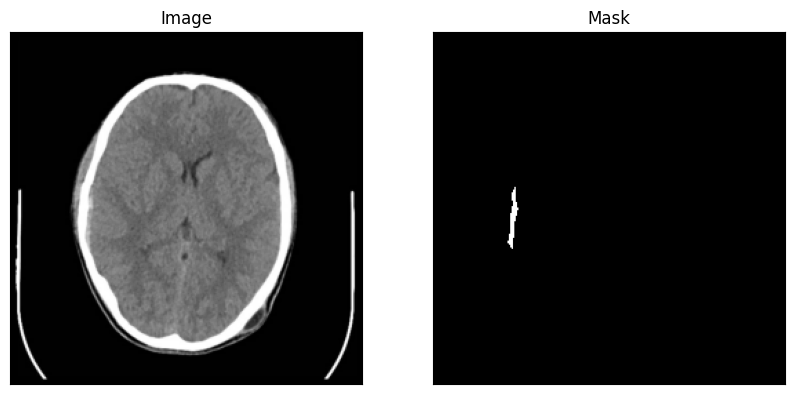

In [ ]:
import random  # Import the random module
import matplotlib.pyplot as plt
import numpy as np

img_num = random.randint(0, len(dataset)-1)
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(example_mask, cmap='gray')  # Assuming the second image is grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

## **1.3.2. MoNuSeg Dataset**

### Create Dataset

In [ ]:
import os
import numpy as np
from PIL import Image
from patchify import patchify
from datasets import Dataset

# Define paths to the directories containing .PNG images
image_dir = '/content/Hi-gMISnet_all_dataset/MoNuSeg/train folder/img'  # Directory with image .png files
mask_dir = '/content/Hi-gMISnet_all_dataset/MoNuSeg/train folder/labelcol'    # Directory with mask .png files

# Desired patch size and step size
patch_size = 256
step = 256
resize_to = (256, 256)  # Define a common size for all images and masks

# Function to load and resize images from a folder
def load_images_from_folder(folder, target_size):
    images = []
    for filename in sorted(os.listdir(folder)):  # Sorting ensures consistent order
        if filename.endswith('.png'):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path).convert('L')  # Convert to grayscale
            img = img.resize(target_size)  # Resize to the target size
            img_np = np.array(img)
            images.append(img_np)
    return np.array(images)

# Load and resize images and masks
large_images = load_images_from_folder(image_dir, resize_to)
large_masks = load_images_from_folder(mask_dir, resize_to)

# Check loaded image and mask shapes
print(f"Loaded {large_images.shape[0]} images of shape {large_images.shape[1:]} (HxW)")
print(f"Loaded {large_masks.shape[0]} masks of shape {large_masks.shape[1:]} (HxW)")

# Extract patches for images
all_img_patches = []
for img in range(large_images.shape[0]):
    large_image = large_images[img]
    patches_img = patchify(large_image, (patch_size, patch_size), step=step)  # No overlap

    for i in range(patches_img.shape[0]):
        for j in range(patches_img.shape[1]):
            single_patch_img = patches_img[i, j, :, :]
            all_img_patches.append(single_patch_img)

images = np.array(all_img_patches)

# Extract patches for masks
all_mask_patches = []
for img in range(large_masks.shape[0]):
    large_mask = large_masks[img]
    patches_mask = patchify(large_mask, (patch_size, patch_size), step=step)  # No overlap

    for i in range(patches_mask.shape[0]):
        for j in range(patches_mask.shape[1]):
            single_patch_mask = patches_mask[i, j, :, :]
            single_patch_mask = (single_patch_mask / 255.).astype(np.uint8)  # Normalize to 0-1 range
            all_mask_patches.append(single_patch_mask)

masks = np.array(all_mask_patches)

# Filter non-empty masks and corresponding images
valid_indices = [i for i, mask in enumerate(masks) if mask.max() != 0]
filtered_images = images[valid_indices]
filtered_masks = masks[valid_indices]

# Print the shapes of the filtered image and mask arrays
print("Image shape:", filtered_images.shape)  # e.g., (num_frames, height, width)
print("Mask shape:", filtered_masks.shape)

# Convert the NumPy arrays to Pillow images and store them in a dictionary
dataset_dict = {
    "image": [Image.fromarray(img) for img in filtered_images],
    "label": [Image.fromarray(mask) for mask in filtered_masks],
}

# Create the dataset using the datasets.Dataset class
dataset = Dataset.from_dict(dataset_dict)


Loaded 24 images of shape (256, 256) (HxW)
Loaded 24 masks of shape (256, 256) (HxW)
Image shape: (24, 256, 256)
Mask shape: (24, 256, 256)


In [ ]:
dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 24
})

### Save Dataset to Drive

In [ ]:
from google.colab import drive
import numpy as np
import pickle

drive.mount('/content/drive')

# Save as pickle file
with open('/content/drive/MyDrive/COMP700/EfficientSAM/monuseg_dataset.pkl', 'wb') as f:
    pickle.dump(dataset_dict, f)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Load the created dataset

In [ ]:
import pickle
from datasets import Dataset
from google.colab import drive

#drive.mount('/content/drive')

# Reload the dataset dictionary from pickle
with open('/content/drive/MyDrive/COMP700/EfficientSAM/monuseg_dataset.pkl', 'rb') as f:
    dataset_dict = pickle.load(f)

# Recreate the Dataset object
dataset = Dataset.from_dict(dataset_dict)

dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 24
})

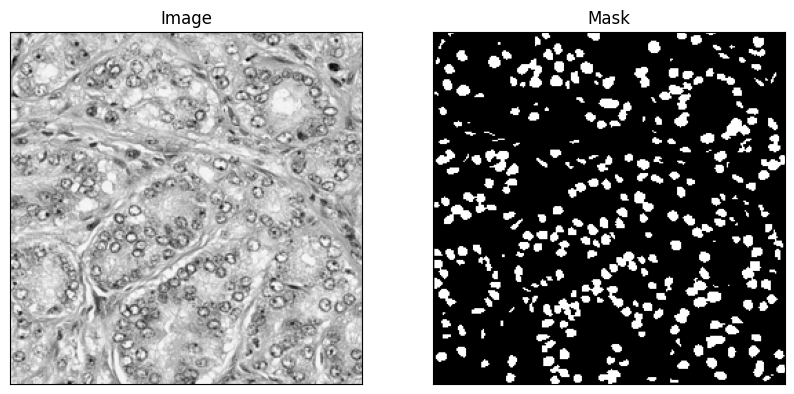

In [ ]:
import random  # Import the random module
import matplotlib.pyplot as plt
import numpy as np

img_num = random.randint(0, len(dataset)-1)
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(example_mask, cmap='gray')  # Assuming the second image is grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

## **1.3.3. GLAS Dataset**

### Create Dataset from GLAS

In [ ]:
import os
import numpy as np
from PIL import Image
from patchify import patchify
from datasets import Dataset

# Define paths to the directories containing .PNG images
image_dir = '/content/Hi-gMISnet_all_dataset/GLAS/Train_Folder/img'  # Directory with image .png files
mask_dir = '/content/Hi-gMISnet_all_dataset/GLAS/Train_Folder/labelcol'    # Directory with mask .png files

# Desired patch size and step size
patch_size = 256
step = 256
resize_to = (256, 256)  # Define a common size for all images and masks

# Function to load and resize images from a folder
def load_images_from_folder(folder, target_size):
    images = []
    for filename in sorted(os.listdir(folder)):  # Sorting ensures consistent order
        if filename.endswith('.png'):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path).convert('L')  # Convert to grayscale
            img = img.resize(target_size)  # Resize to the target size
            img_np = np.array(img)
            images.append(img_np)
    return np.array(images)

# Load and resize images and masks
large_images = load_images_from_folder(image_dir, resize_to)
large_masks = load_images_from_folder(mask_dir, resize_to)

# Check loaded image and mask shapes
print(f"Loaded {large_images.shape[0]} images of shape {large_images.shape[1:]} (HxW)")
print(f"Loaded {large_masks.shape[0]} masks of shape {large_masks.shape[1:]} (HxW)")

# Extract patches for images
all_img_patches = []
for img in range(large_images.shape[0]):
    large_image = large_images[img]
    patches_img = patchify(large_image, (patch_size, patch_size), step=step)  # No overlap

    for i in range(patches_img.shape[0]):
        for j in range(patches_img.shape[1]):
            single_patch_img = patches_img[i, j, :, :]
            all_img_patches.append(single_patch_img)

images = np.array(all_img_patches)

# Extract patches for masks
all_mask_patches = []
for img in range(large_masks.shape[0]):
    large_mask = large_masks[img]
    patches_mask = patchify(large_mask, (patch_size, patch_size), step=step)  # No overlap

    for i in range(patches_mask.shape[0]):
        for j in range(patches_mask.shape[1]):
            single_patch_mask = patches_mask[i, j, :, :]
            single_patch_mask = (single_patch_mask / 255.).astype(np.uint8)  # Normalize to 0-1 range
            all_mask_patches.append(single_patch_mask)

masks = np.array(all_mask_patches)

# Filter non-empty masks and corresponding images
valid_indices = [i for i, mask in enumerate(masks) if mask.max() != 0]
filtered_images = images[valid_indices]
filtered_masks = masks[valid_indices]

# Print the shapes of the filtered image and mask arrays
print("Image shape:", filtered_images.shape)  # e.g., (num_frames, height, width)
print("Mask shape:", filtered_masks.shape)

# Convert the NumPy arrays to Pillow images and store them in a dictionary
dataset_dict = {
    "image": [Image.fromarray(img) for img in filtered_images],
    "label": [Image.fromarray(mask) for mask in filtered_masks],
}

# Create the dataset using the datasets.Dataset class
dataset = Dataset.from_dict(dataset_dict)


Loaded 72 images of shape (256, 256) (HxW)
Loaded 72 masks of shape (256, 256) (HxW)
Image shape: (0, 256, 256)
Mask shape: (0, 256, 256)


In [ ]:
dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 0
})

Save the created dataset into the drive

In [ ]:
from google.colab import drive
import numpy as np
import pickle

drive.mount('/content/drive')

# Save as pickle file
with open('/content/drive/MyDrive/COMP700/EfficientSAM/glas_dataset.pkl', 'wb') as f:
    pickle.dump(dataset_dict, f)


### Load the GLAS Dataset

In [ ]:
import pickle
from datasets import Dataset
from google.colab import drive

#drive.mount('/content/drive')

# Reload the dataset dictionary from pickle
with open('/content/drive/MyDrive/COMP700/EfficientSAM/glas_dataset.pkl', 'rb') as f:
    dataset_dict = pickle.load(f)

# Recreate the Dataset object
dataset = Dataset.from_dict(dataset_dict)

dataset

Display an example image and mask to check if dataset loads properly

In [ ]:
import random  # Import the random module
import matplotlib.pyplot as plt
import numpy as np

img_num = random.randint(0, len(dataset)-1)
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(example_mask, cmap='gray')  # Assuming the second image is grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

## **1.3.4. BUSI Dataset**

### Create Dataset from BUSI

In [ ]:
import os
import numpy as np
from PIL import Image
from patchify import patchify
from datasets import Dataset

# Define paths to the directories containing .PNG images
image_dir = '/content/Hi-gMISnet_all_dataset/BUSI/train_folder/img'  # Directory with image .png files
mask_dir = '/content/Hi-gMISnet_all_dataset/BUSI/train_folder/label'    # Directory with mask .png files

# Desired patch size and step size
patch_size = 256
step = 256
resize_to = (256, 256)  # Define a common size for all images and masks

# Function to load and resize images from a folder
def load_images_from_folder(folder, target_size):
    images = []
    for filename in sorted(os.listdir(folder)):  # Sorting ensures consistent order
        if filename.endswith('.png'):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path).convert('L')  # Convert to grayscale
            img = img.resize(target_size)  # Resize to the target size
            img_np = np.array(img)
            images.append(img_np)
    return np.array(images)

# Load and resize images and masks
large_images = load_images_from_folder(image_dir, resize_to)
large_masks = load_images_from_folder(mask_dir, resize_to)

# Check loaded image and mask shapes
print(f"Loaded {large_images.shape[0]} images of shape {large_images.shape[1:]} (HxW)")
print(f"Loaded {large_masks.shape[0]} masks of shape {large_masks.shape[1:]} (HxW)")

# Extract patches for images
all_img_patches = []
for img in range(large_images.shape[0]):
    large_image = large_images[img]
    patches_img = patchify(large_image, (patch_size, patch_size), step=step)  # No overlap

    for i in range(patches_img.shape[0]):
        for j in range(patches_img.shape[1]):
            single_patch_img = patches_img[i, j, :, :]
            all_img_patches.append(single_patch_img)

images = np.array(all_img_patches)

# Extract patches for masks
all_mask_patches = []
for img in range(large_masks.shape[0]):
    large_mask = large_masks[img]
    patches_mask = patchify(large_mask, (patch_size, patch_size), step=step)  # No overlap

    for i in range(patches_mask.shape[0]):
        for j in range(patches_mask.shape[1]):
            single_patch_mask = patches_mask[i, j, :, :]
            single_patch_mask = (single_patch_mask / 255.).astype(np.uint8)  # Normalize to 0-1 range
            all_mask_patches.append(single_patch_mask)

masks = np.array(all_mask_patches)

# Filter non-empty masks and corresponding images
valid_indices = [i for i, mask in enumerate(masks) if mask.max() != 0]
filtered_images = images[valid_indices]
filtered_masks = masks[valid_indices]

# Print the shapes of the filtered image and mask arrays
print("Image shape:", filtered_images.shape)  # e.g., (num_frames, height, width)
print("Mask shape:", filtered_masks.shape)

# Convert the NumPy arrays to Pillow images and store them in a dictionary
dataset_dict = {
    "image": [Image.fromarray(img) for img in filtered_images],
    "label": [Image.fromarray(mask) for mask in filtered_masks],
}

# Create the dataset using the datasets.Dataset class
dataset = Dataset.from_dict(dataset_dict)


Loaded 517 images of shape (256, 256) (HxW)
Loaded 517 masks of shape (256, 256) (HxW)
Image shape: (517, 256, 256)
Mask shape: (517, 256, 256)


In [ ]:
dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 517
})

Save the dataset into Drive

In [ ]:
from google.colab import drive
import numpy as np
import pickle

drive.mount('/content/drive')

# Save as pickle file
with open('/content/drive/MyDrive/COMP700/EfficientSAM/busi_dataset.pkl', 'wb') as f:
    pickle.dump(dataset_dict, f)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Load the BUSI Dataset

In [ ]:
import pickle
from datasets import Dataset
from google.colab import drive

#drive.mount('/content/drive')

# Reload the dataset dictionary from pickle
with open('/content/drive/MyDrive/COMP700/EfficientSAM/busi_dataset.pkl', 'rb') as f:
    dataset_dict = pickle.load(f)

# Recreate the Dataset object
dataset = Dataset.from_dict(dataset_dict)

dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 517
})

Make sure the dataset is working properly after loading from drive

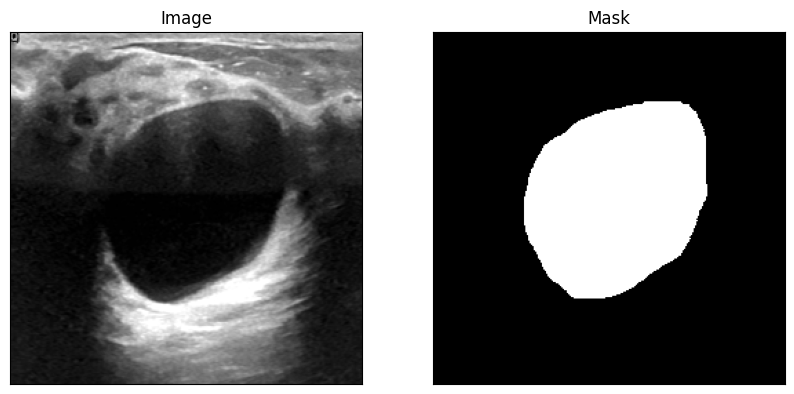

In [ ]:
import random  # Import the random module
import matplotlib.pyplot as plt
import numpy as np

img_num = random.randint(0, len(dataset)-1)
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(example_mask, cmap='gray')  # Assuming the second image is grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

## **1.3.5. CVC_Clinic_DB**

### Create Dataset from CVC_CLINIC_DB

In [ ]:
import os
import numpy as np
from PIL import Image
from patchify import patchify
from datasets import Dataset

# Define paths to the directories containing .PNG images
image_dir = '/content/Hi-gMISnet_all_dataset/CVC_clinic_DB/train/train folder/img'  # Directory with image .jpg files
mask_dir = '/content/Hi-gMISnet_all_dataset/CVC_clinic_DB/train/train folder/label'    # Directory with mask .jpg files

# Desired patch size and step size
patch_size = 256
step = 256
resize_to = (256, 256)  # Define a common size for all images and masks

# Function to load and resize images from a folder
def load_images_from_folder(folder, target_size):
    images = []
    for filename in sorted(os.listdir(folder)):  # Sorting ensures consistent order
        if filename.endswith('.png'):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path).convert('L')  # Convert to grayscale
            img = img.resize(target_size)  # Resize to the target size
            img_np = np.array(img)
            images.append(img_np)
    return np.array(images)

# Load and resize images and masks
large_images = load_images_from_folder(image_dir, resize_to)
large_masks = load_images_from_folder(mask_dir, resize_to)

# Check loaded image and mask shapes
print(f"Loaded {large_images.shape[0]} images of shape {large_images.shape[1:]} (HxW)")
print(f"Loaded {large_masks.shape[0]} masks of shape {large_masks.shape[1:]} (HxW)")

# Extract patches for images
all_img_patches = []
for img in range(large_images.shape[0]):
    large_image = large_images[img]
    patches_img = patchify(large_image, (patch_size, patch_size), step=step)  # No overlap

    for i in range(patches_img.shape[0]):
        for j in range(patches_img.shape[1]):
            single_patch_img = patches_img[i, j, :, :]
            all_img_patches.append(single_patch_img)

images = np.array(all_img_patches)

# Extract patches for masks
all_mask_patches = []
for img in range(large_masks.shape[0]):
    large_mask = large_masks[img]
    patches_mask = patchify(large_mask, (patch_size, patch_size), step=step)  # No overlap

    for i in range(patches_mask.shape[0]):
        for j in range(patches_mask.shape[1]):
            single_patch_mask = patches_mask[i, j, :, :]
            single_patch_mask = (single_patch_mask / 255.).astype(np.uint8)  # Normalize to 0-1 range
            all_mask_patches.append(single_patch_mask)

masks = np.array(all_mask_patches)

# Filter non-empty masks and corresponding images
valid_indices = [i for i, mask in enumerate(masks) if mask.max() != 0]
filtered_images = images[valid_indices]
filtered_masks = masks[valid_indices]

# Print the shapes of the filtered image and mask arrays
print("Image shape:", filtered_images.shape)  # e.g., (num_frames, height, width)
print("Mask shape:", filtered_masks.shape)

# Convert the NumPy arrays to Pillow images and store them in a dictionary
dataset_dict = {
    "image": [Image.fromarray(img) for img in filtered_images],
    "label": [Image.fromarray(mask) for mask in filtered_masks],
}

# Create the dataset using the datasets.Dataset class
dataset = Dataset.from_dict(dataset_dict)


Loaded 490 images of shape (256, 256) (HxW)
Loaded 490 masks of shape (256, 256) (HxW)
Image shape: (490, 256, 256)
Mask shape: (490, 256, 256)


In [ ]:
dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 490
})

Save the created dataset into the drive

In [ ]:
from google.colab import drive
import numpy as np
import pickle

drive.mount('/content/drive')

# Save as pickle file
with open('/content/drive/MyDrive/COMP700/EfficientSAM/cvc_clinic_dataset.pkl', 'wb') as f:
    pickle.dump(dataset_dict, f)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Load the CVC_Clinic Dataset

In [ ]:
import pickle
from datasets import Dataset
from google.colab import drive

#drive.mount('/content/drive')

# Reload the dataset dictionary from pickle
with open('/content/drive/MyDrive/COMP700/EfficientSAM/cvc_clinic_dataset.pkl', 'rb') as f:
    dataset_dict = pickle.load(f)

# Recreate the Dataset object
dataset = Dataset.from_dict(dataset_dict)

dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 490
})

Make sure the dataset loads images and masks properly

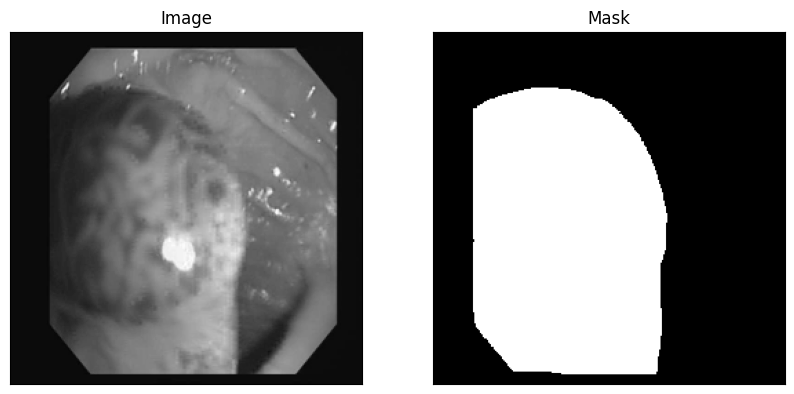

In [ ]:
import random  # Import the random module
import matplotlib.pyplot as plt
import numpy as np

img_num = random.randint(0, len(dataset)-1)
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(example_mask, cmap='gray')  # Assuming the second image is grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

# **1.4. Kvasir Dataset**

## Download dataset

In [ ]:
!kaggle datasets download abdallahwagih/kvasir-dataset-for-classification-and-segmentation
!unzip -q kvasir-dataset-for-classification-and-segmentation.zip

Dataset URL: https://www.kaggle.com/datasets/abdallahwagih/kvasir-dataset-for-classification-and-segmentation
License(s): CC0-1.0
100% 1.19G/1.20G [00:19<00:00, 76.5MB/s]
100% 1.20G/1.20G [00:19<00:00, 66.7MB/s]


## Create Dataset from KVASIR

In [ ]:
import os
import numpy as np
from PIL import Image
from patchify import patchify
from datasets import Dataset

# Define paths to the directories containing .jpg images
image_dir = '/content/kvasir-seg/Kvasir-SEG/images'  # directory with image .jpg files
mask_dir = '/content/kvasir-seg/Kvasir-SEG/masks'    # directory with mask .jpg files

# Desired patch size and step size
patch_size = 256
step = 256
resize_to = (256, 256)  # define a common size for all images and masks, our case = 256x256

# Function to load and resize images from a folder
def load_images_from_folder(folder, target_size):
    images = []
    for filename in sorted(os.listdir(folder)):  # sorting ensures consistent order for images and related masks
        if filename.endswith('.jpg'):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path).convert('L')  # converts images to grayscale
            img = img.resize(target_size)  # resizes images to the target size (256x256)
            img_np = np.array(img)
            images.append(img_np)
    return np.array(images)

# Load and resize images and masks
large_images = load_images_from_folder(image_dir, resize_to)
large_masks = load_images_from_folder(mask_dir, resize_to)

# Check loaded image and mask shapes
print(f"Loaded {large_images.shape[0]} images of shape {large_images.shape[1:]} (HxW)")
print(f"Loaded {large_masks.shape[0]} masks of shape {large_masks.shape[1:]} (HxW)")

# Extract patches for images
all_img_patches = []
for img in range(large_images.shape[0]):
    large_image = large_images[img]
    patches_img = patchify(large_image, (patch_size, patch_size), step=step)

    for i in range(patches_img.shape[0]):
        for j in range(patches_img.shape[1]):
            single_patch_img = patches_img[i, j, :, :]
            all_img_patches.append(single_patch_img)

images = np.array(all_img_patches)

# Extract patches for masks
all_mask_patches = []
for img in range(large_masks.shape[0]):
    large_mask = large_masks[img]
    patches_mask = patchify(large_mask, (patch_size, patch_size), step=step)

    for i in range(patches_mask.shape[0]):
        for j in range(patches_mask.shape[1]):
            single_patch_mask = patches_mask[i, j, :, :]
            single_patch_mask = (single_patch_mask / 255.).astype(np.uint8)  # normalize masks i.e.) 0-1 range
            all_mask_patches.append(single_patch_mask)

masks = np.array(all_mask_patches)

# Filter non-empty masks and corresponding images
valid_indices = [i for i, mask in enumerate(masks) if mask.max() != 0]
filtered_images = images[valid_indices]
filtered_masks = masks[valid_indices]

# Print the shapes of the filtered image and mask arrays
print("Image shape:", filtered_images.shape)  # of the form: (num_frames, height, width)
print("Mask shape:", filtered_masks.shape) # of the form: (num_frames, height, width)

# Convert the NumPy arrays to Pillow images and store them in a dictionary
dataset_dict = {
    "image": [Image.fromarray(img) for img in filtered_images],
    "label": [Image.fromarray(mask) for mask in filtered_masks],
}

# Create the dataset using the datasets.Dataset class
dataset = Dataset.from_dict(dataset_dict)


Loaded 1000 images of shape (256, 256) (HxW)
Loaded 1000 masks of shape (256, 256) (HxW)
Image shape: (1000, 256, 256)
Mask shape: (1000, 256, 256)


In [ ]:
dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 1000
})

Save the dataset into the Drive

In [ ]:
from google.colab import drive
import numpy as np
import pickle

drive.mount('/content/drive')

# Save as pickle file
with open('/content/drive/MyDrive/COMP700/EfficientSAM/kvasir_dataset.pkl', 'wb') as f:
    pickle.dump(dataset_dict, f)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Load the Created Dataset

In [ ]:
import pickle
from datasets import Dataset
from google.colab import drive

#drive.mount('/content/drive')

# Reload the dataset dictionary from pickle
with open('/content/drive/MyDrive/COMP700/EfficientSAM/kvasir_dataset.pkl', 'rb') as f:
    dataset_dict = pickle.load(f)

# Recreate the Dataset object
dataset = Dataset.from_dict(dataset_dict)

dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 1000
})

Let us make sure that the data is being loaded properly

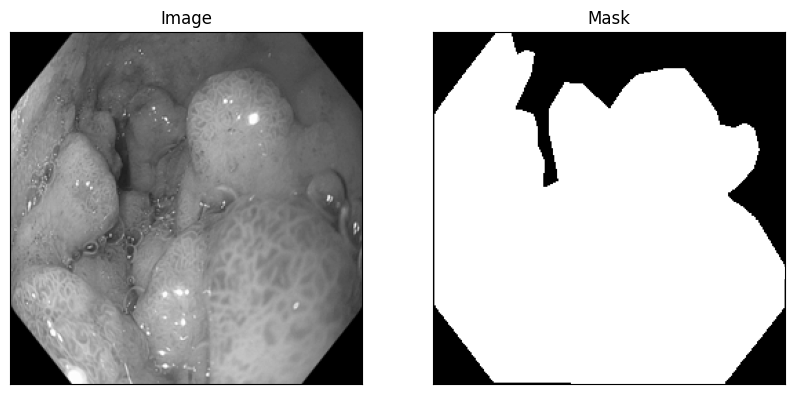

In [ ]:
import random  # Import the random module
import matplotlib.pyplot as plt
import numpy as np

img_num = random.randint(0, len(dataset)-1)
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(example_mask, cmap='gray')  # Assuming the second image is grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

# **2. Segment Anything Model Implementation**

## **A. Combine Created Datasets**

In [ ]:
import os
import pickle
from datasets import Dataset, concatenate_datasets
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define the folder path where your .pkl files are stored
folder_path = '/content/drive/MyDrive/COMP700/EfficientSAM/'

# List all .pkl files in the folder
pkl_files = [os.path.join(folder_path, file)
for file in os.listdir(folder_path)
if file.endswith('.pkl') and not file.endswith('test_dataset.pkl') and not file.endswith('valid_dataset.pkl')]

# Initialize an empty list to store datasets found in the folder
datasets = []

# Loop through each .pkl file and load the dataset to create the combined dataset used for training
for pkl_file in pkl_files:
    dataset_name = os.path.basename(pkl_file)  # Extract the dataset name
    print(f"Loading Dataset: {dataset_name}")
    with open(pkl_file, 'rb') as f:
        dataset_dict = pickle.load(f)
        dataset = Dataset.from_dict(dataset_dict)
        datasets.append(dataset)

# Combine all datasets into one (will be used for training/fine-tuning)
combined_dataset = concatenate_datasets(datasets)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loading Dataset: kvasir_dataset.pkl
Loading Dataset: cvc_clinic_dataset.pkl
Loading Dataset: busi_dataset.pkl
Loading Dataset: monuseg_dataset.pkl
Loading Dataset: physionet_dataset.pkl
Loading Dataset: retina_dataset.pkl
Loading Dataset: chestxray_dataset.pkl
Loading Dataset: liverseg_dataset.pkl
Loading Dataset: heart_ct_dataset.pkl
Loading Dataset: ctbrain_mrct_dataset.pkl
Loading Dataset: mrbrain_mrct_dataset.pkl
Loading Dataset: colondb_dataset.pkl
Loading Dataset: etis_polyp_dataset.pkl
Loading Dataset: kvasir_sessile_dataset.pkl
Loading Dataset: cvc_tif_dataset.pkl
Loading Dataset: polyp_seg_dataset.pkl
Loading Dataset: polypdb_bli_dataset.pkl
Loading Dataset: polypdb_fice_dataset.pkl
Loading Dataset: polypdb_lci_dataset.pkl
Loading Dataset: polypdb_nbi_dataset.pkl
Loading Dataset: polypdb_wli_dataset.pkl
Loading Dataset: busi_synthetic_dataset.pkl
Loa

In [ ]:
combined_dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 13988
})

## **B. Dataset Visualization**

In [ ]:
import os
import pickle
from datasets import Dataset, concatenate_datasets
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/drive')

# Define the folder path where your .pkl files are stored
folder_path = '/content/drive/MyDrive/COMP700/EfficientSAM/'

# List all .pkl files in the folder
pkl_files = [os.path.join(folder_path, file)
             for file in os.listdir(folder_path)
             if file.endswith('dataset.pkl')]

# Initialize an empty list to store datasets found in the folder
datasets = []

# Loop through each .pkl file and load the dataset to create the combined dataset used for training
for pkl_file in pkl_files:
    dataset_name = os.path.basename(pkl_file)  # extract the dataset name from the stored name in the google drive
    print(f"Loading Dataset: {dataset_name}")
    with open(pkl_file, 'rb') as f:
        dataset_dict = pickle.load(f)
        dataset = Dataset.from_dict(dataset_dict)
        datasets.append(dataset)

# Combine all datasets into one (will be used for training/fine-tuning)
combined_dataset = concatenate_datasets(datasets)




Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loading Dataset: kvasir_dataset.pkl
Loading Dataset: cvc_clinic_dataset.pkl
Loading Dataset: busi_dataset.pkl
Loading Dataset: monuseg_dataset.pkl
Loading Dataset: physionet_dataset.pkl
Loading Dataset: retina_dataset.pkl
Loading Dataset: chestxray_dataset.pkl
Loading Dataset: liverseg_dataset.pkl
Loading Dataset: heart_ct_dataset.pkl
Loading Dataset: ctbrain_mrct_dataset.pkl
Loading Dataset: mrbrain_mrct_dataset.pkl
Loading Dataset: colondb_dataset.pkl
Loading Dataset: etis_polyp_dataset.pkl
Loading Dataset: kvasir_sessile_dataset.pkl
Loading Dataset: cvc_tif_dataset.pkl
Loading Dataset: polyp_seg_dataset.pkl
Loading Dataset: polypdb_bli_dataset.pkl
Loading Dataset: polypdb_fice_dataset.pkl
Loading Dataset: polypdb_lci_dataset.pkl
Loading Dataset: polypdb_nbi_dataset.pkl
Loading Dataset: polypdb_wli_dataset.pkl
Loading Dataset: busi_synthetic_dataset.pkl
Loa


Displaying samples from Dataset 1:


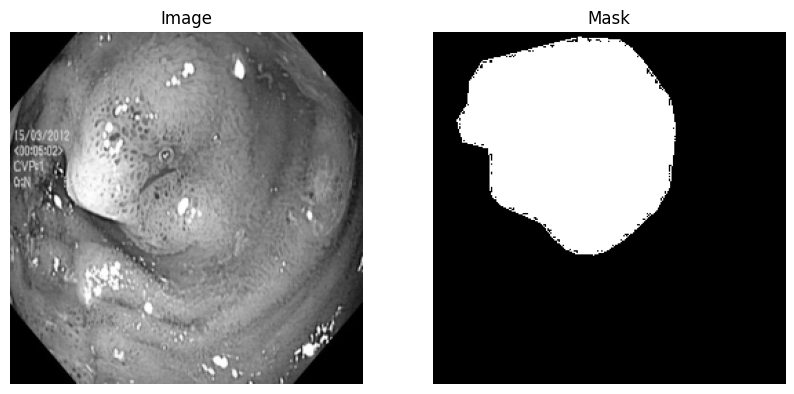

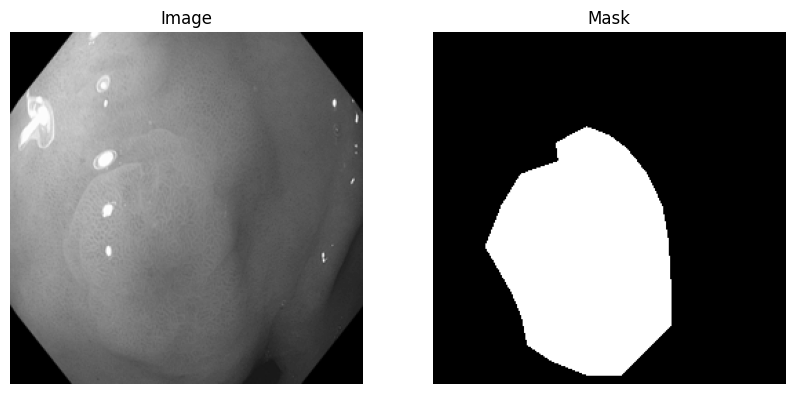


Displaying samples from Dataset 2:


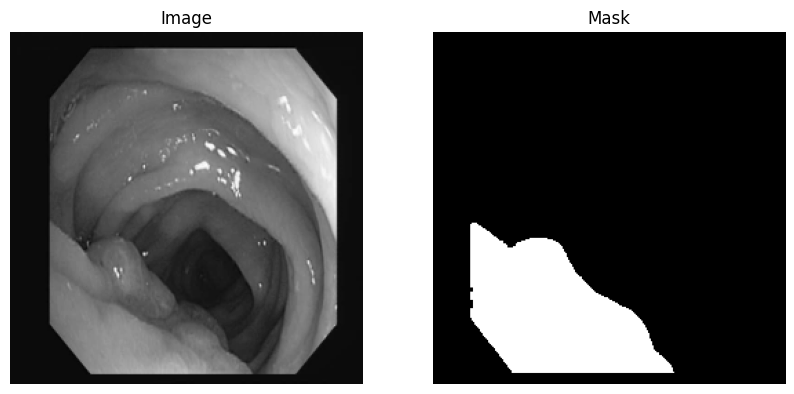

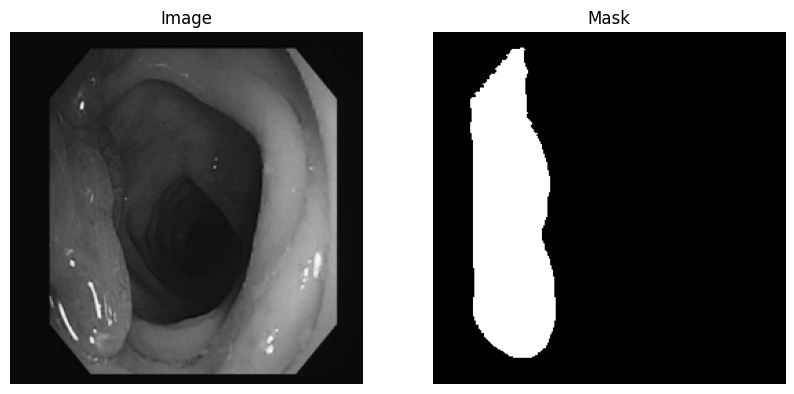


Displaying samples from Dataset 3:


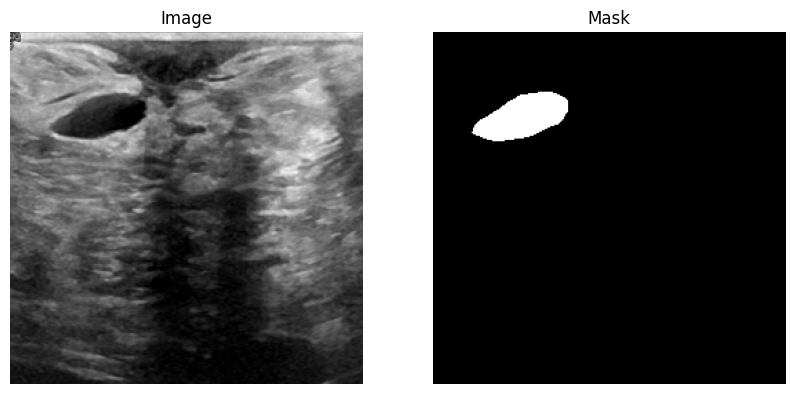

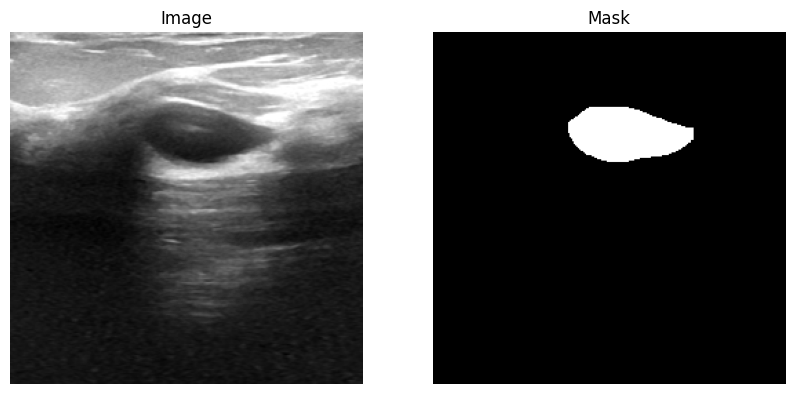


Displaying samples from Dataset 4:


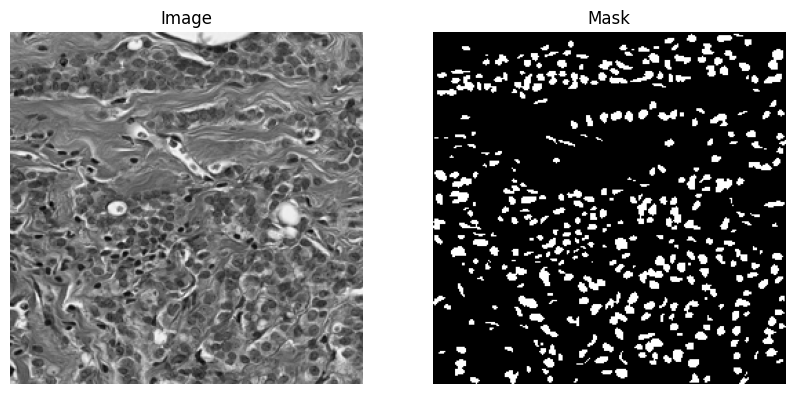

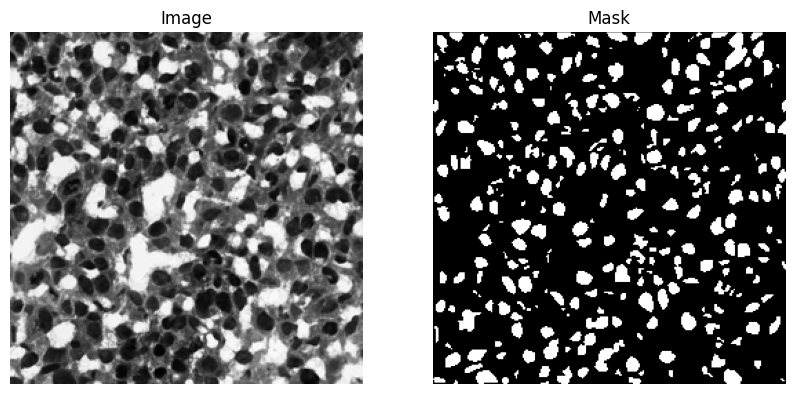


Displaying samples from Dataset 5:


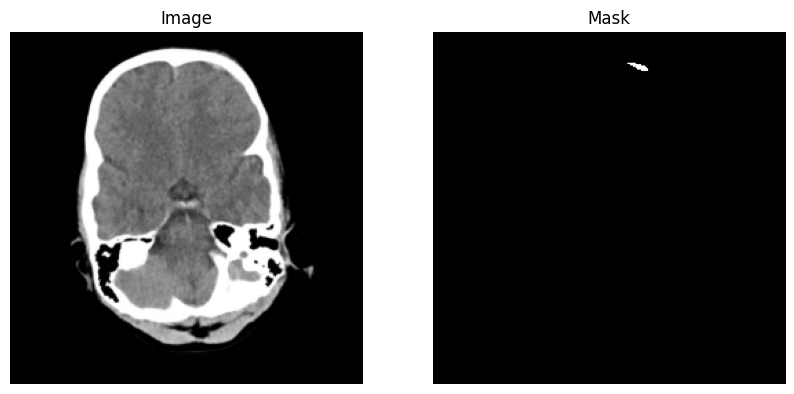

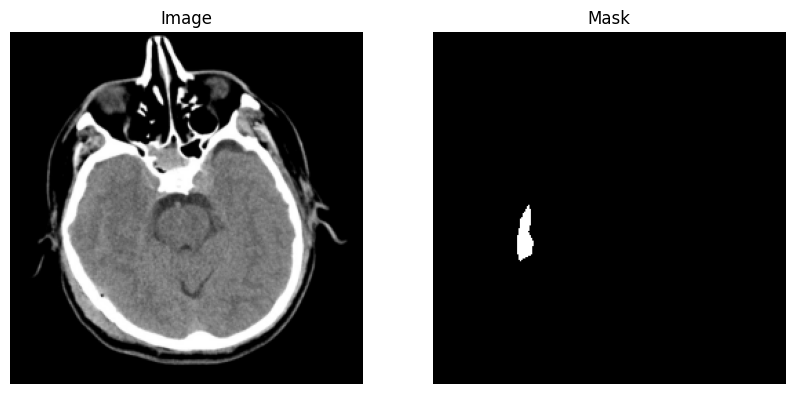


Displaying samples from Dataset 6:


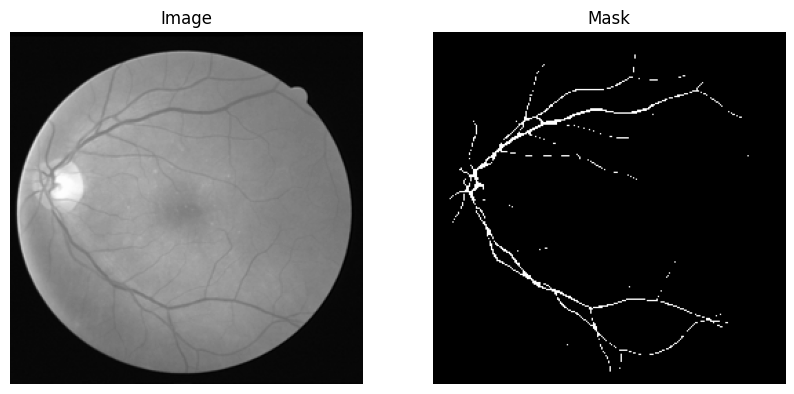

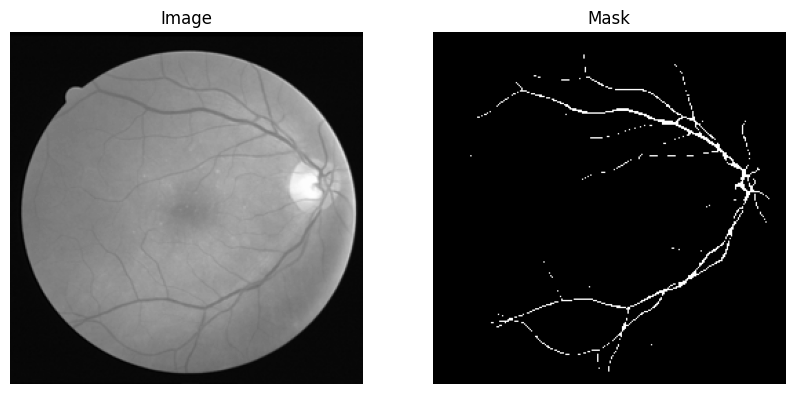


Displaying samples from Dataset 7:


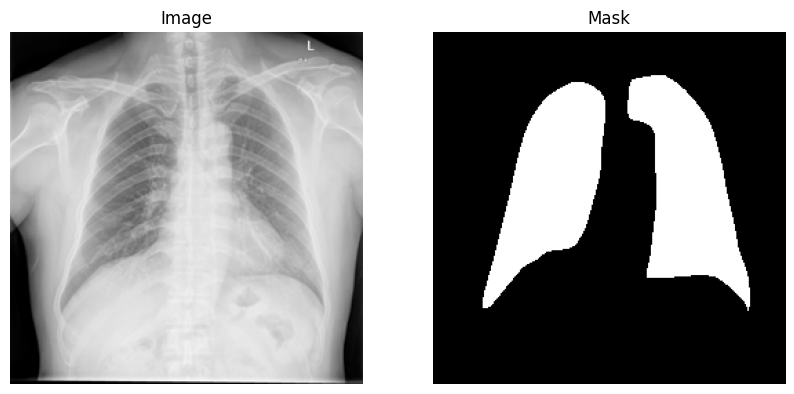

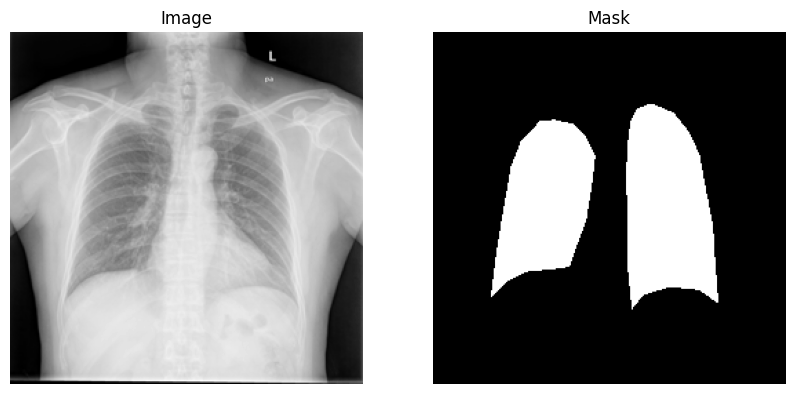


Displaying samples from Dataset 8:


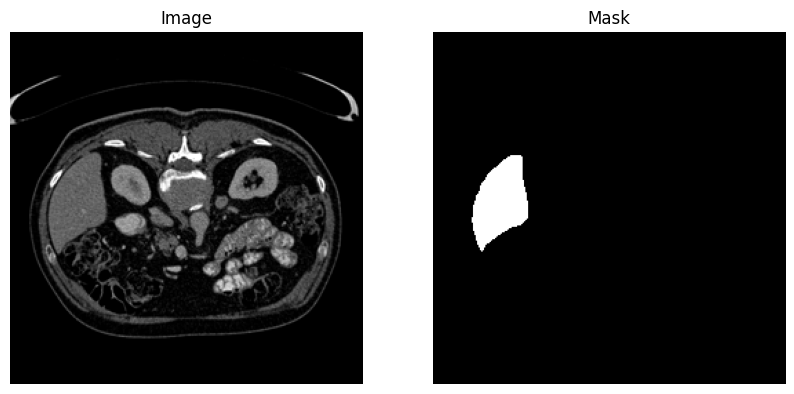

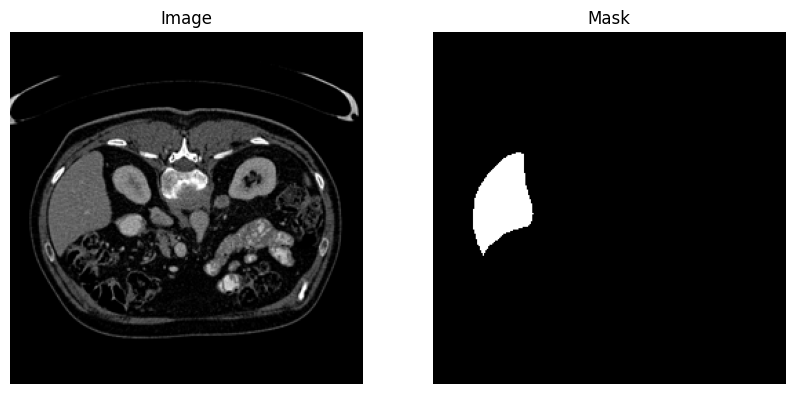


Displaying samples from Dataset 9:


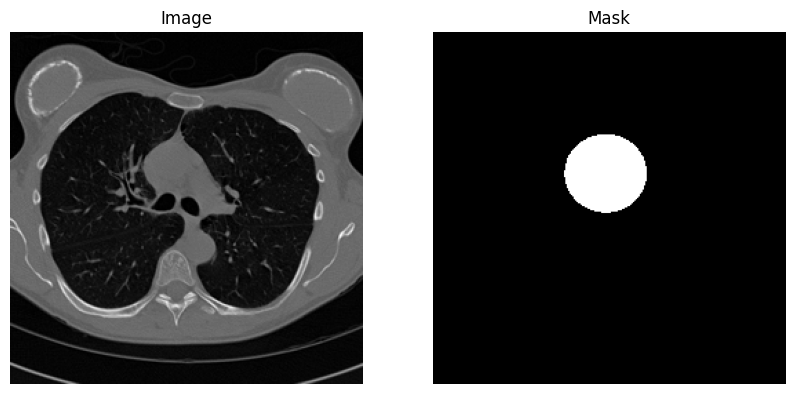

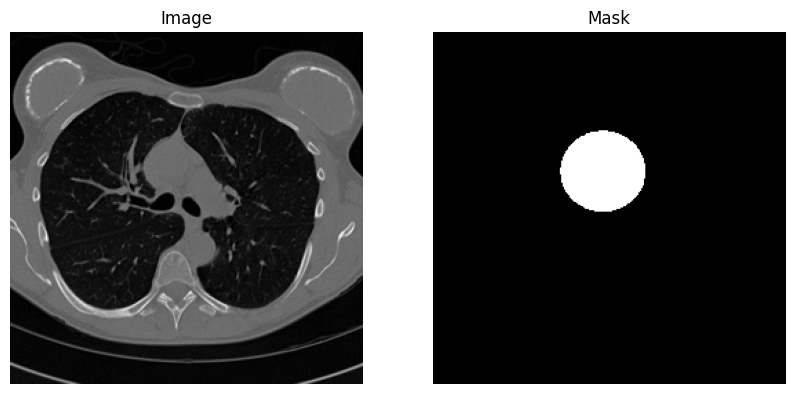


Displaying samples from Dataset 10:


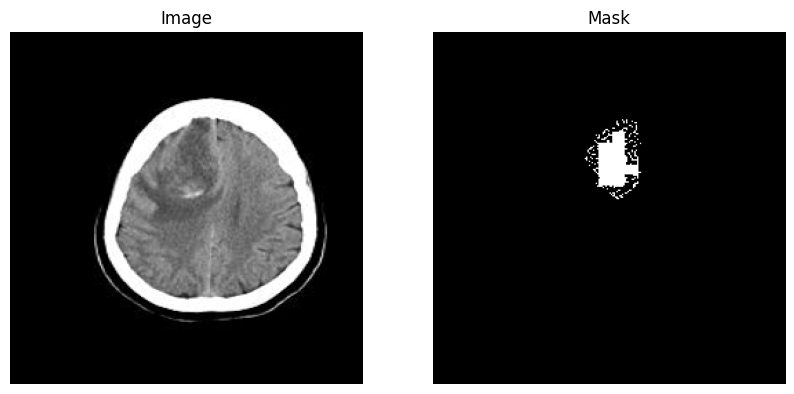

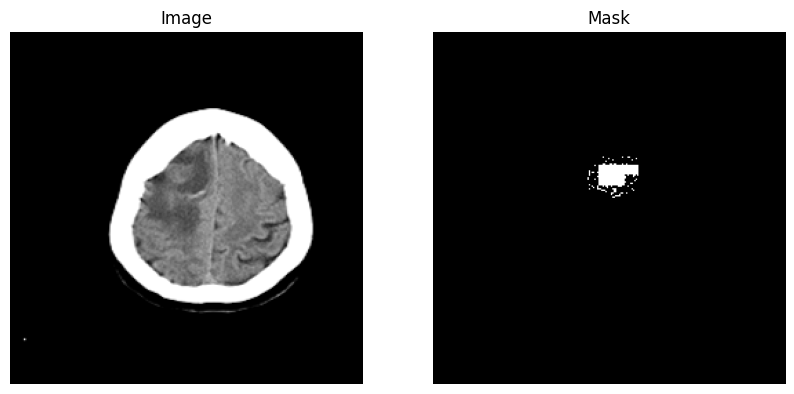


Displaying samples from Dataset 11:


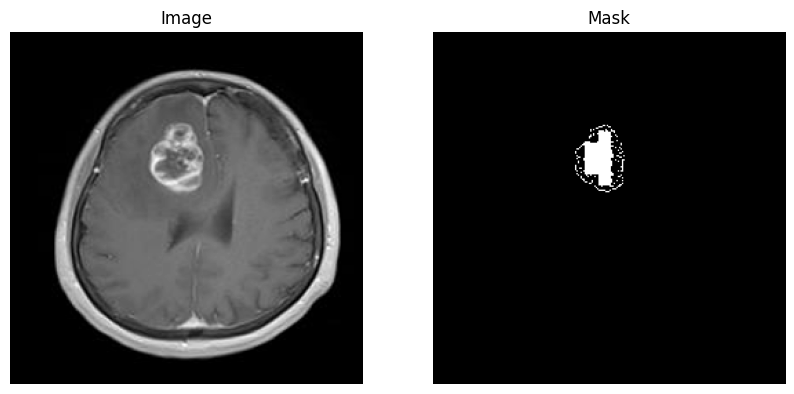

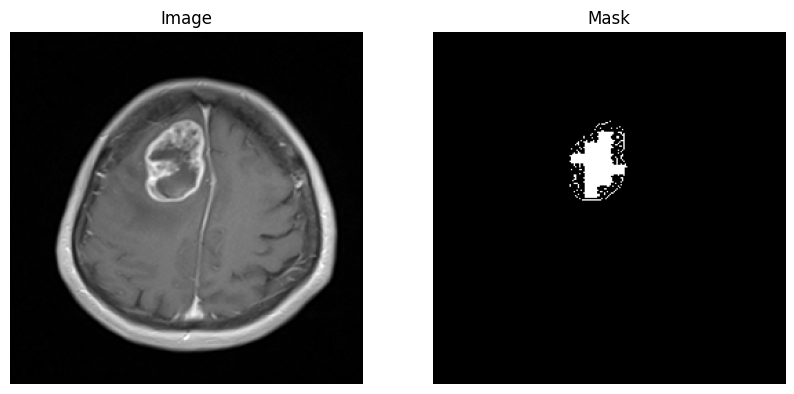


Displaying samples from Dataset 12:


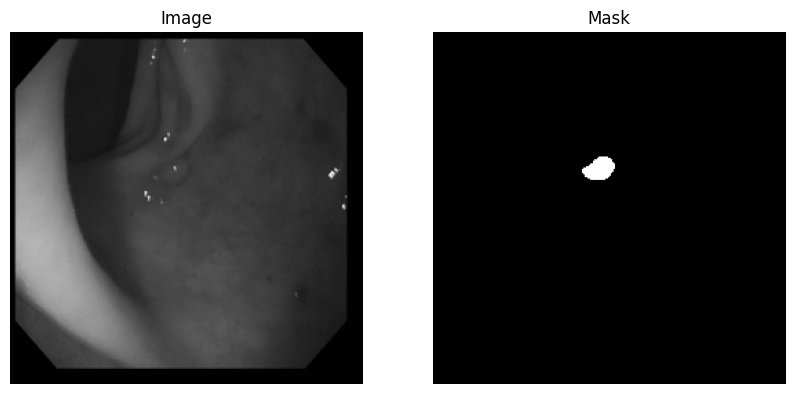

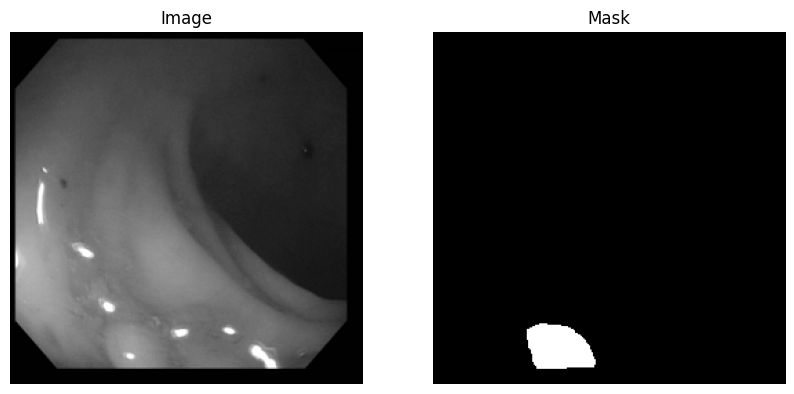


Displaying samples from Dataset 13:


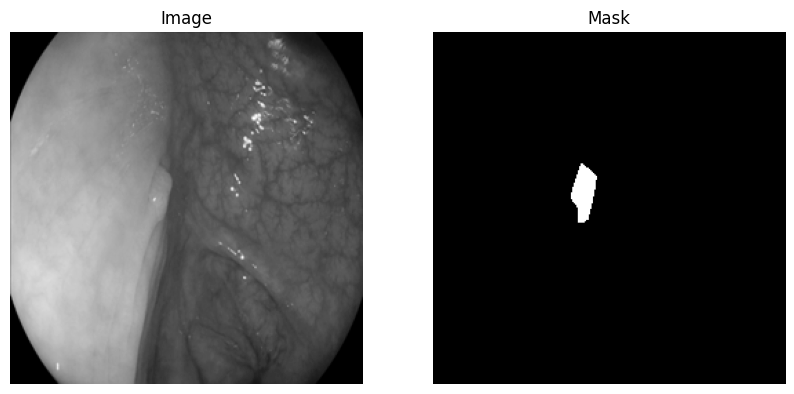

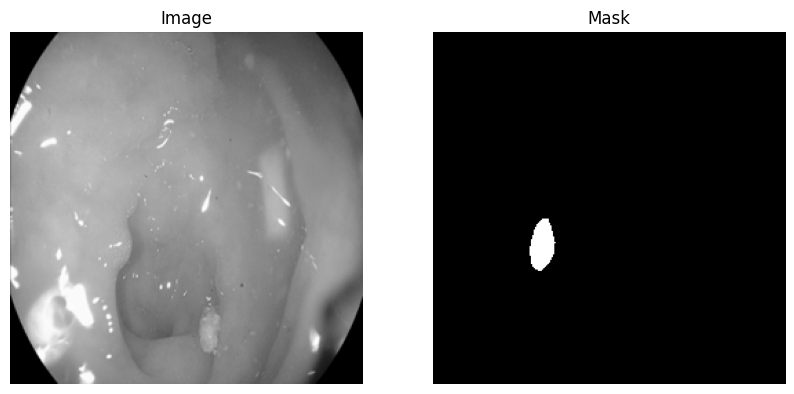


Displaying samples from Dataset 14:


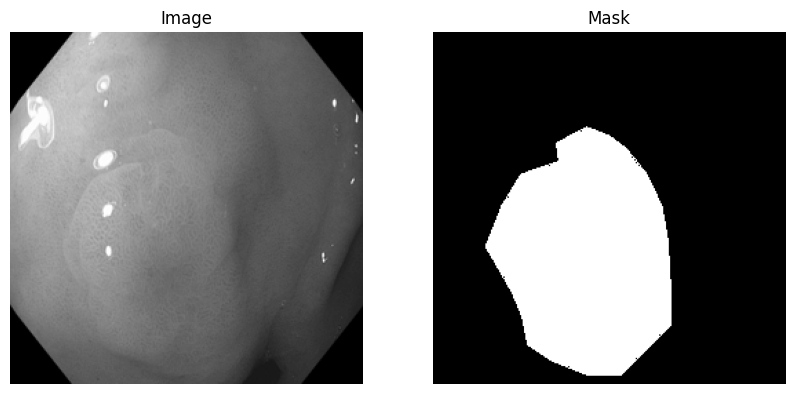

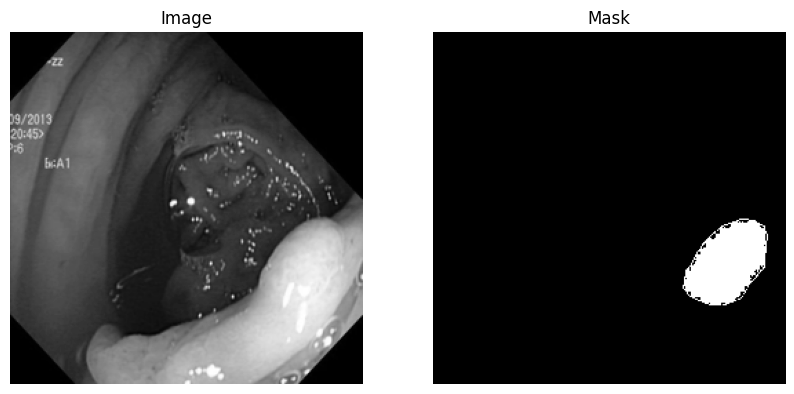


Displaying samples from Dataset 15:


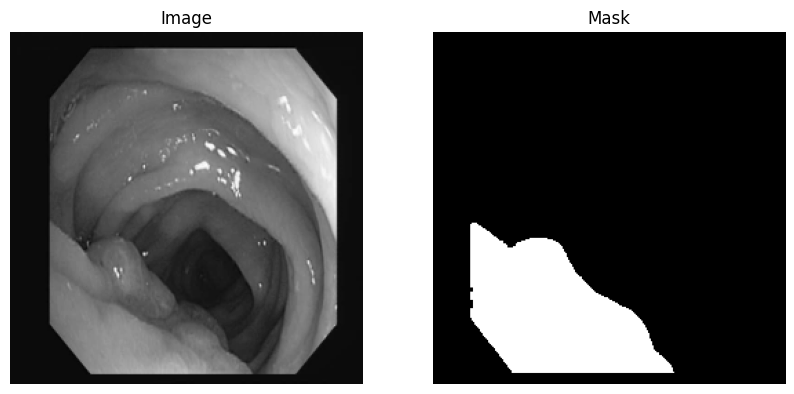

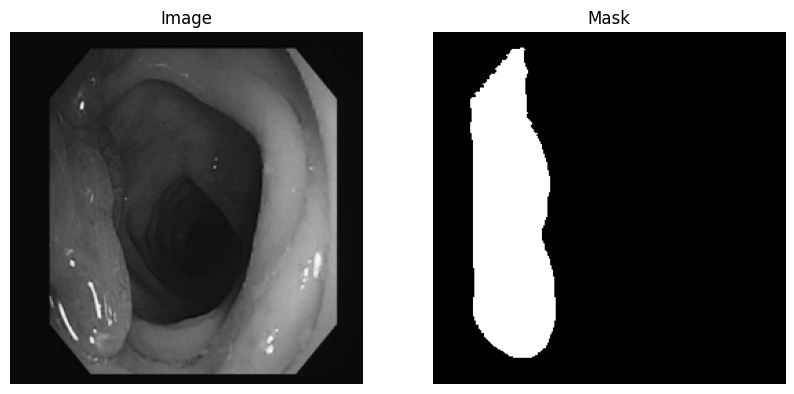


Displaying samples from Dataset 16:


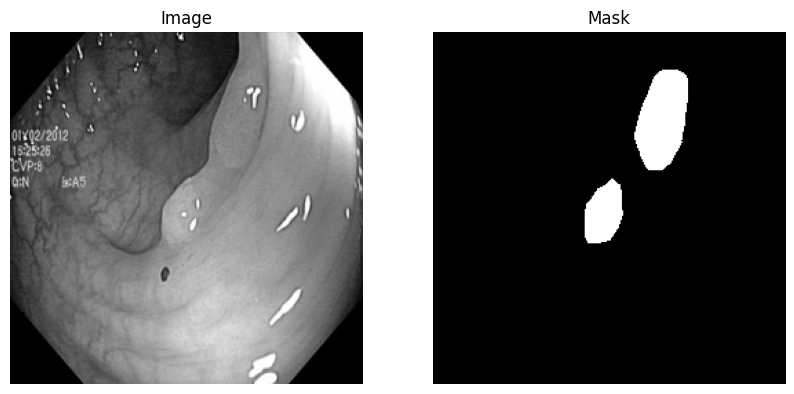

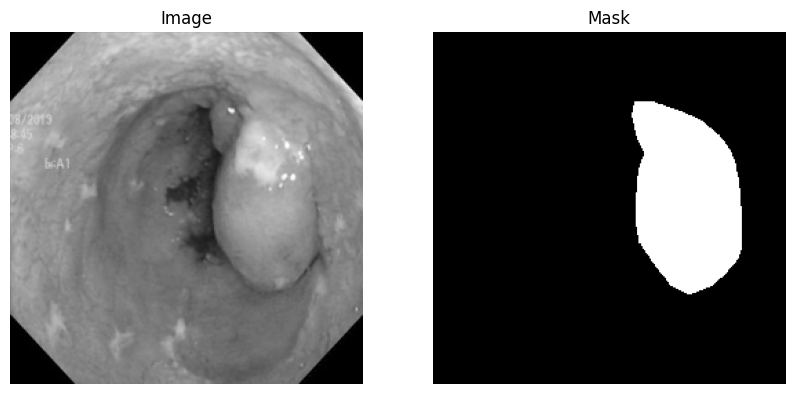


Displaying samples from Dataset 17:


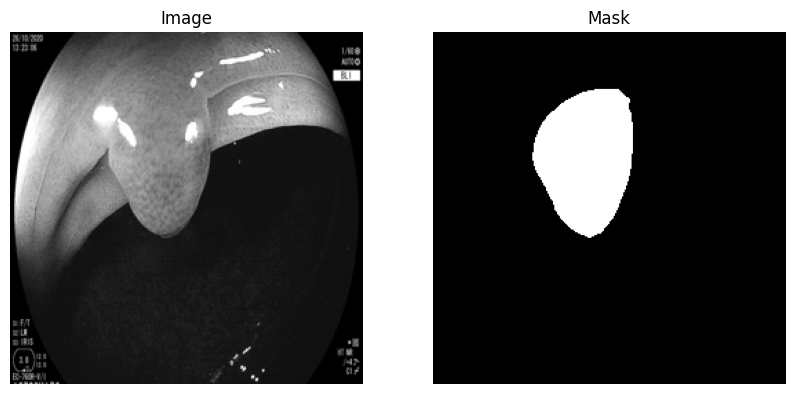

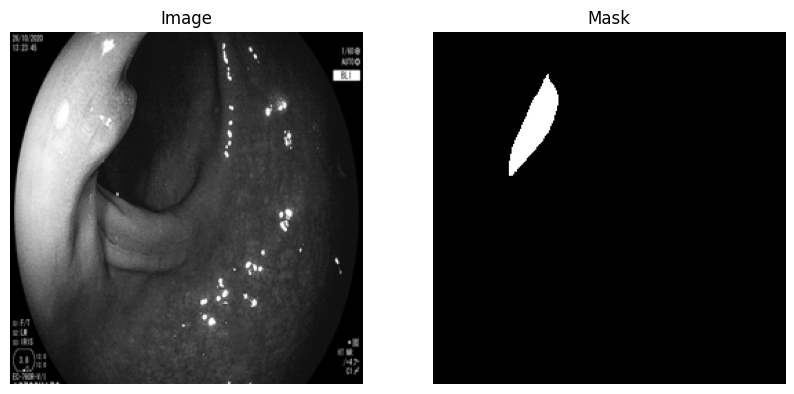


Displaying samples from Dataset 18:


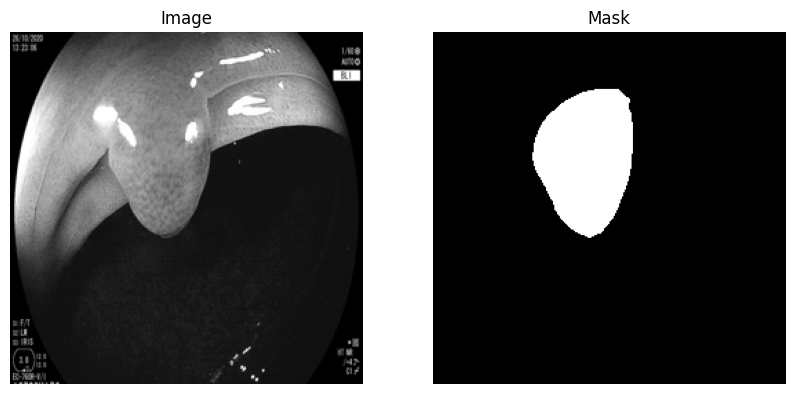

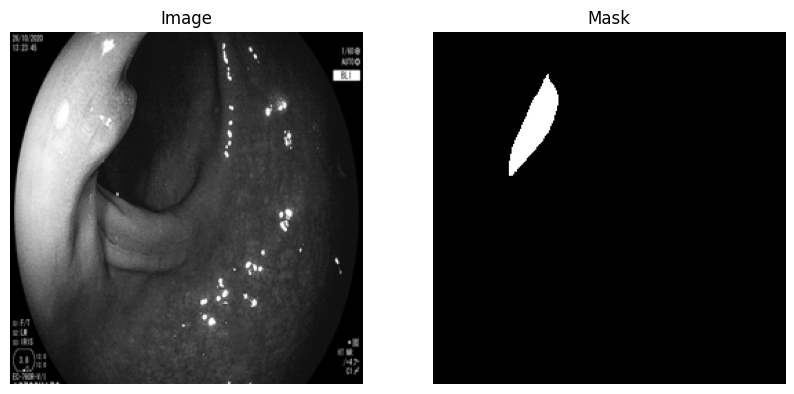


Displaying samples from Dataset 19:


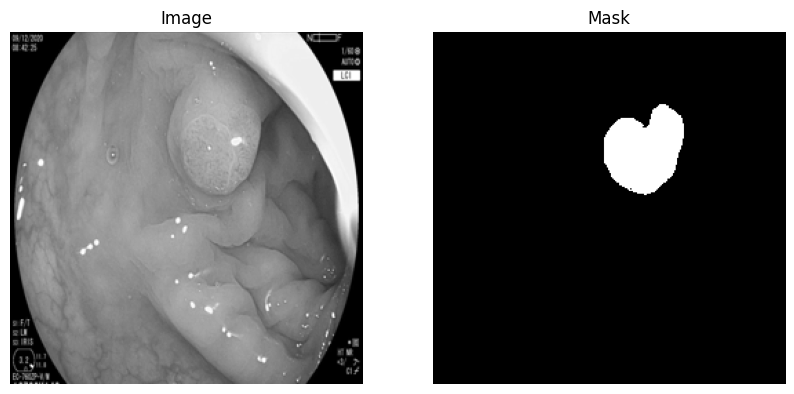

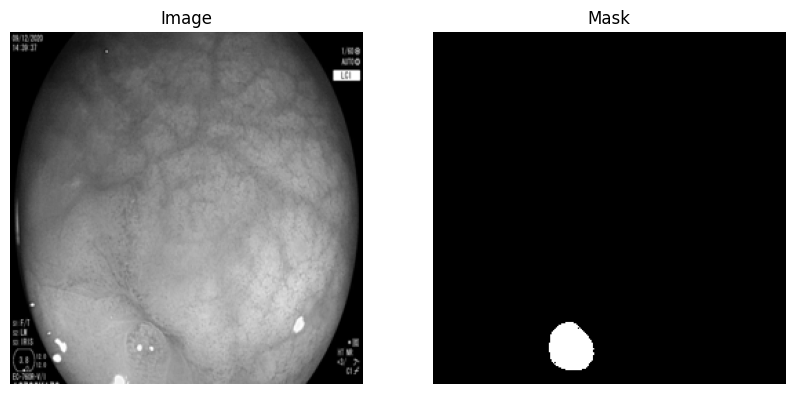


Displaying samples from Dataset 20:


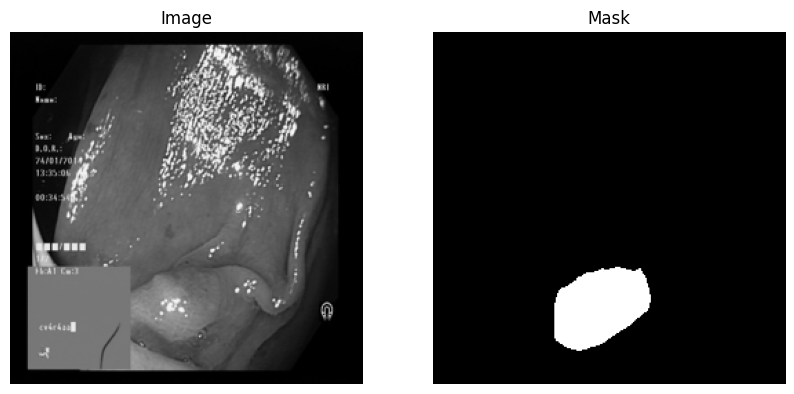

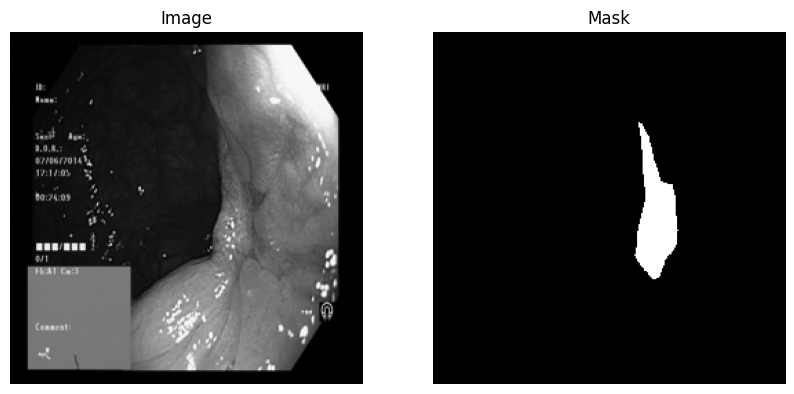


Displaying samples from Dataset 21:


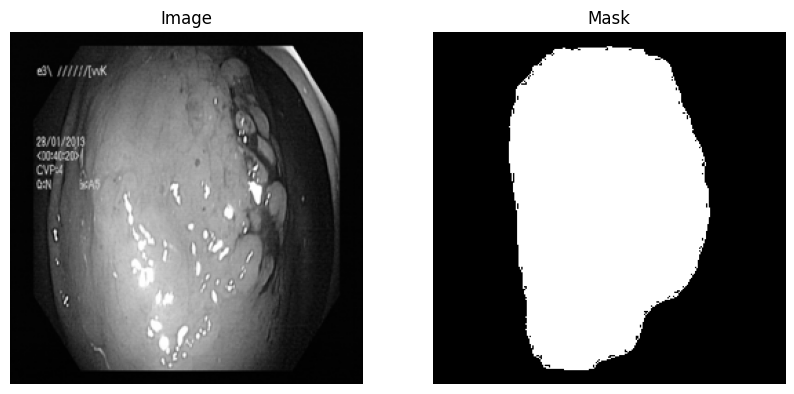

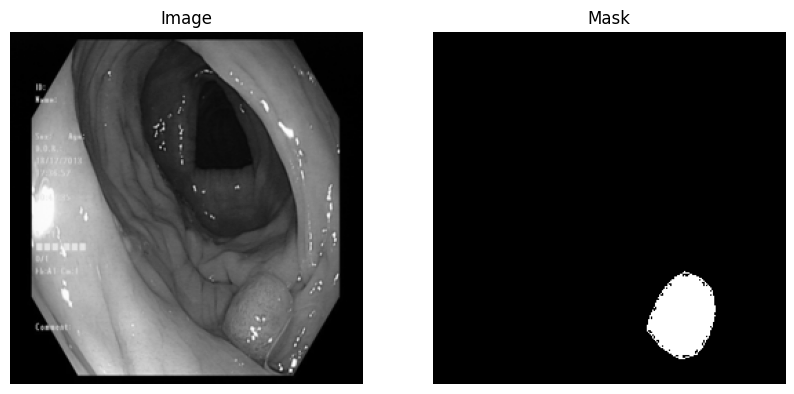


Displaying samples from Dataset 22:


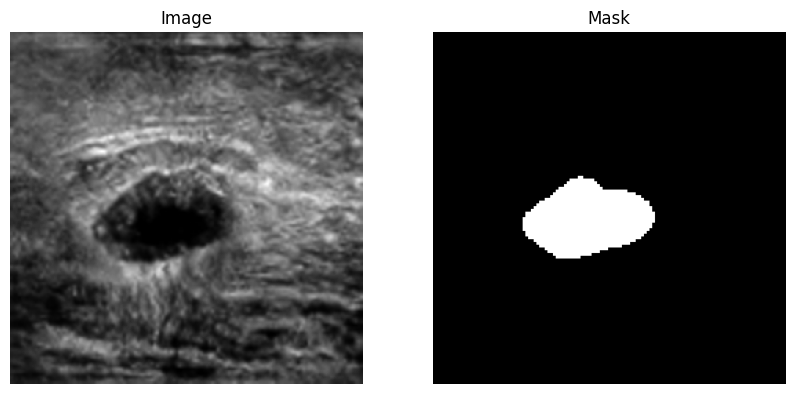

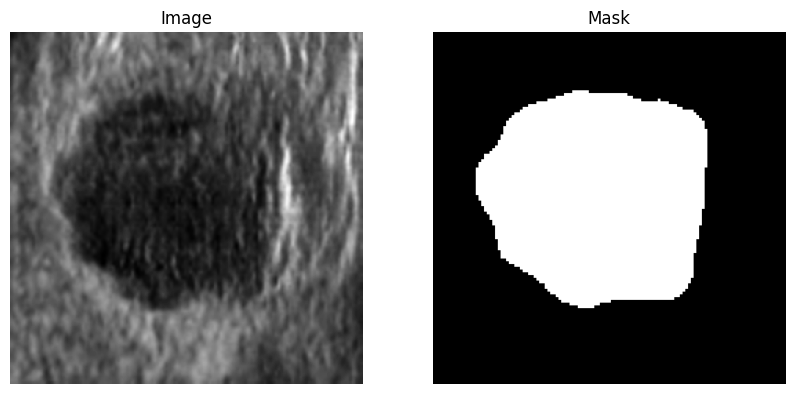


Displaying samples from Dataset 23:


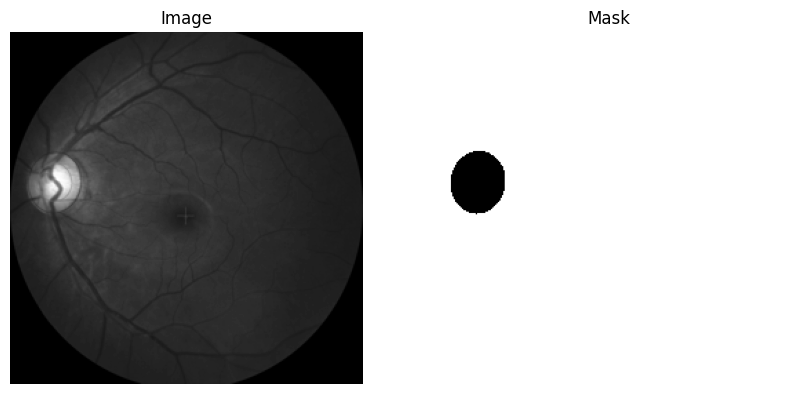

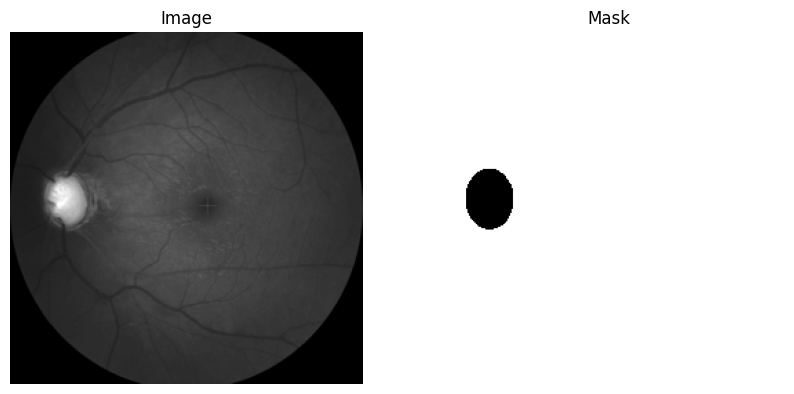


Displaying samples from Dataset 24:


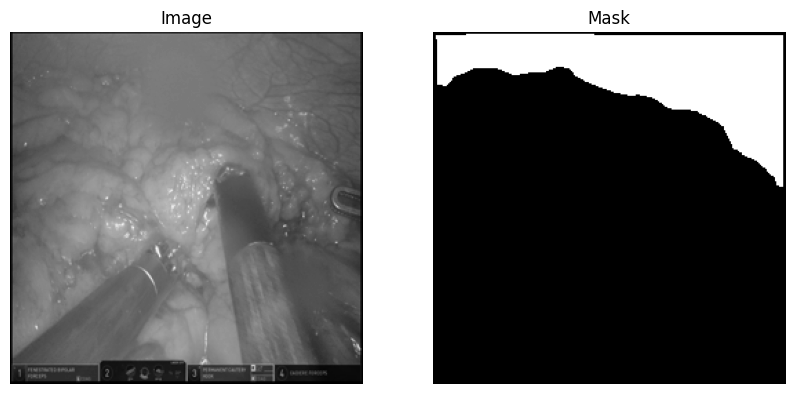

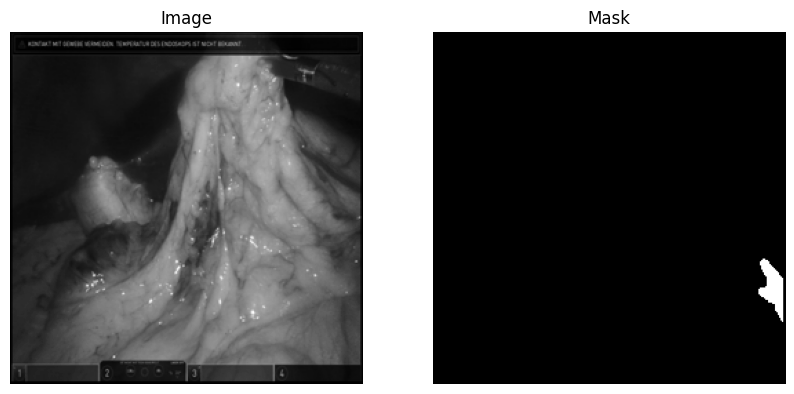


Displaying samples from Dataset 25:


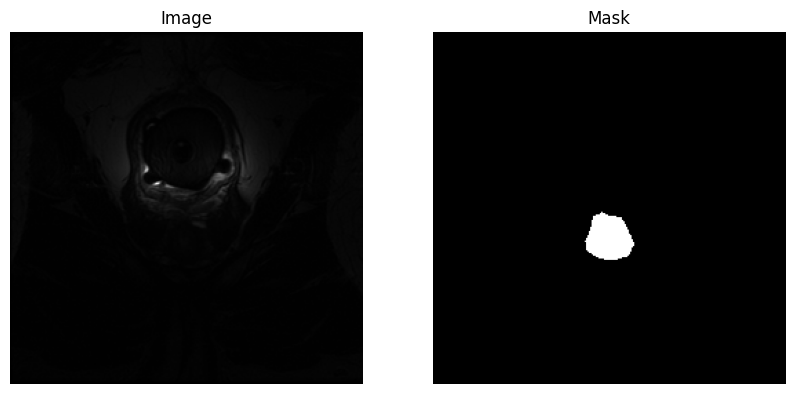

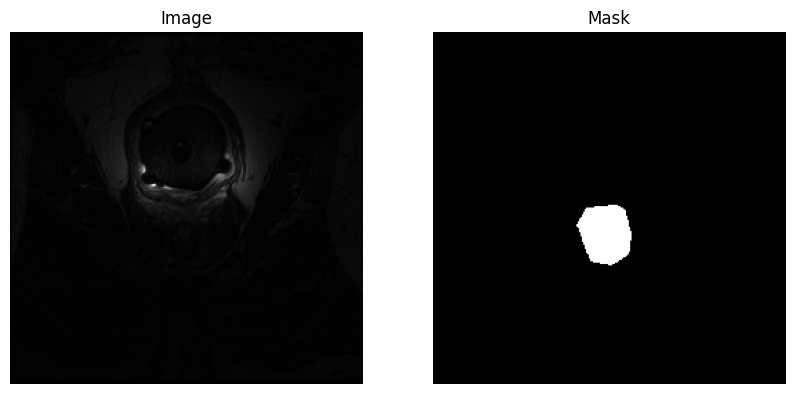


Displaying samples from Dataset 26:


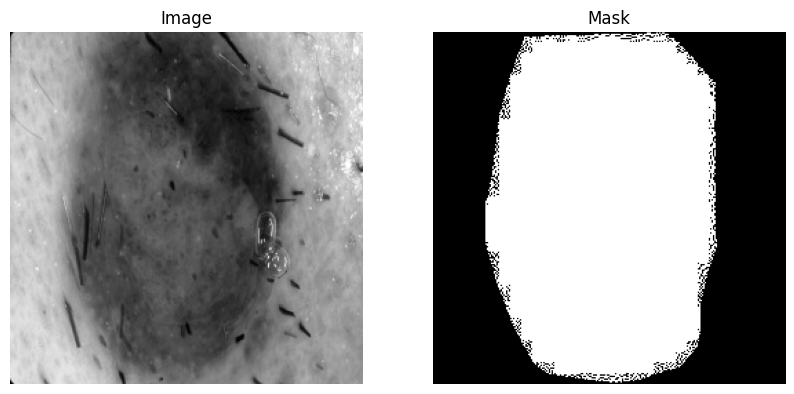

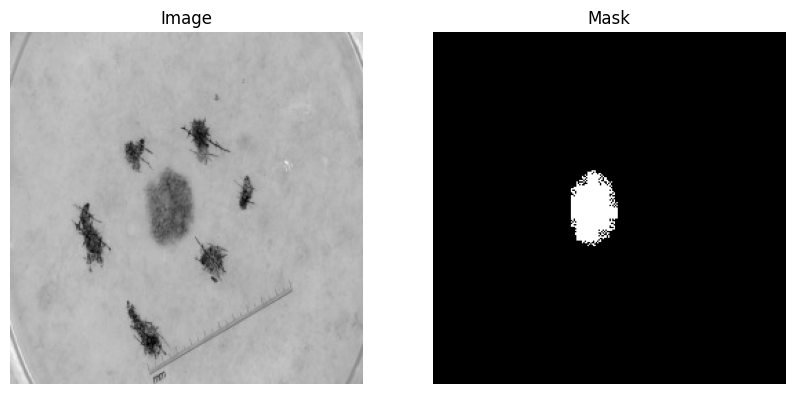


Displaying samples from Dataset 27:


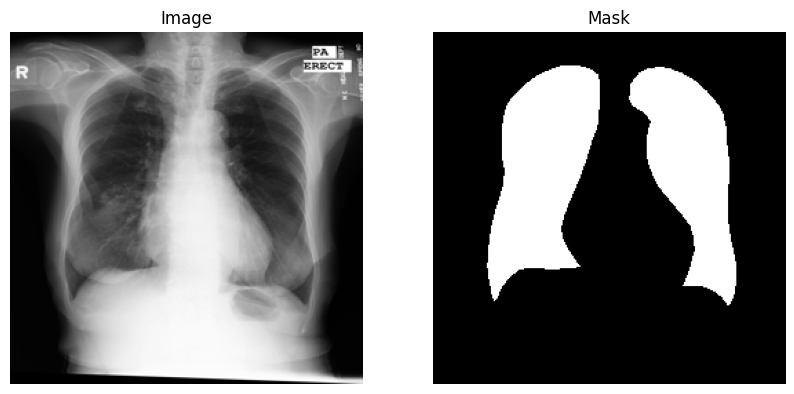

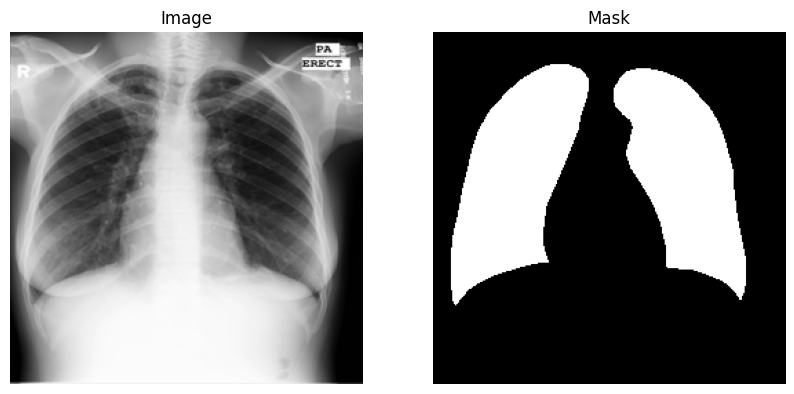


Displaying samples from Dataset 28:


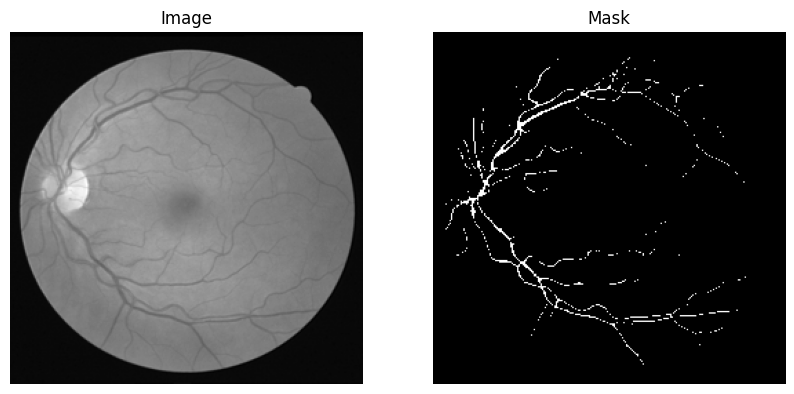

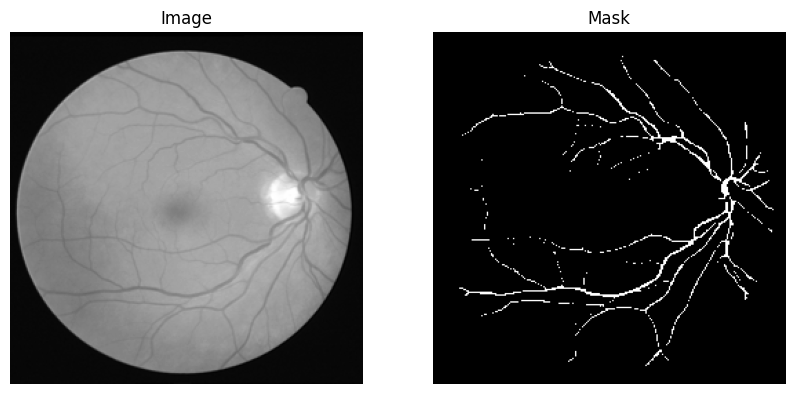


Displaying samples from Dataset 29:


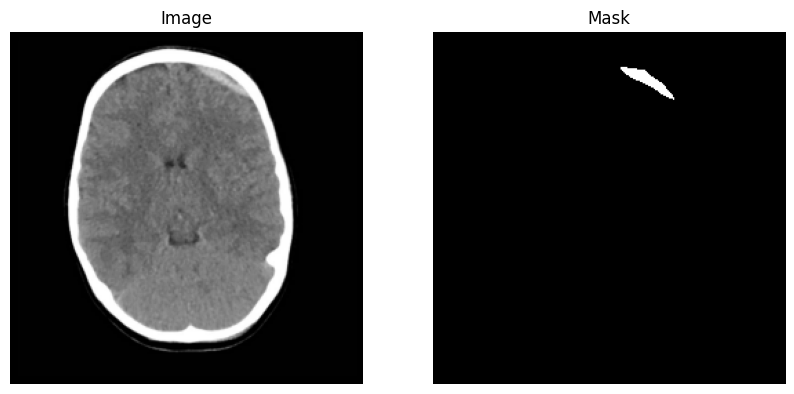

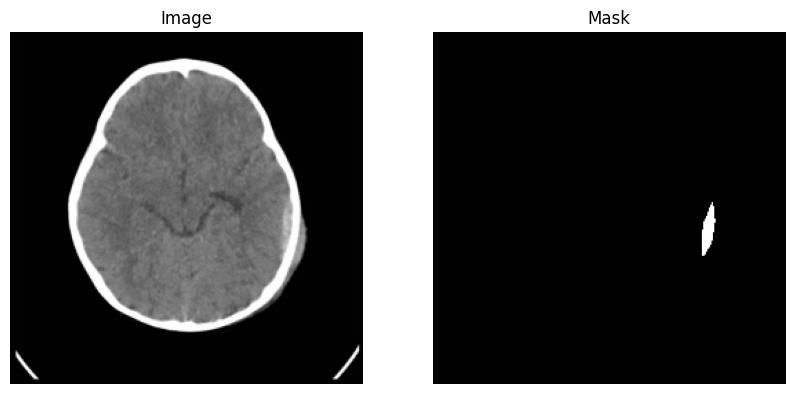


Displaying samples from Dataset 30:


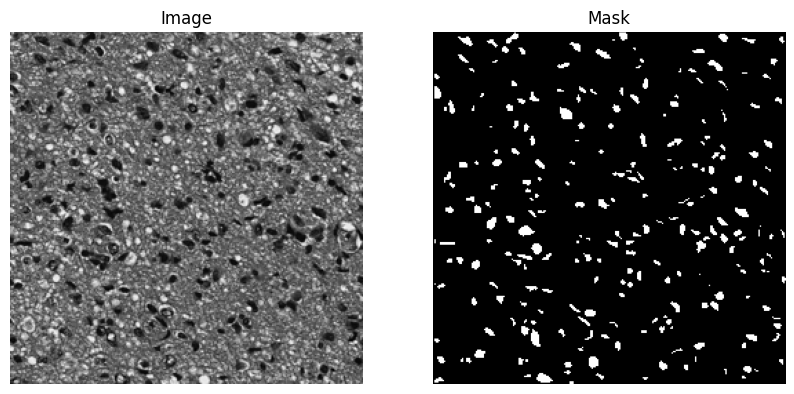

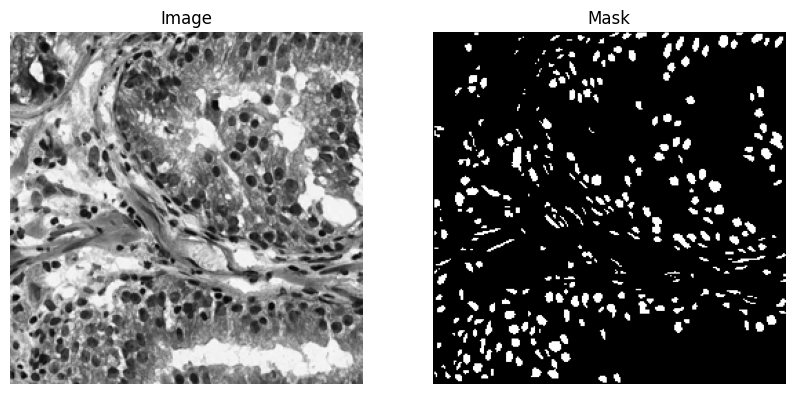


Displaying samples from Dataset 31:


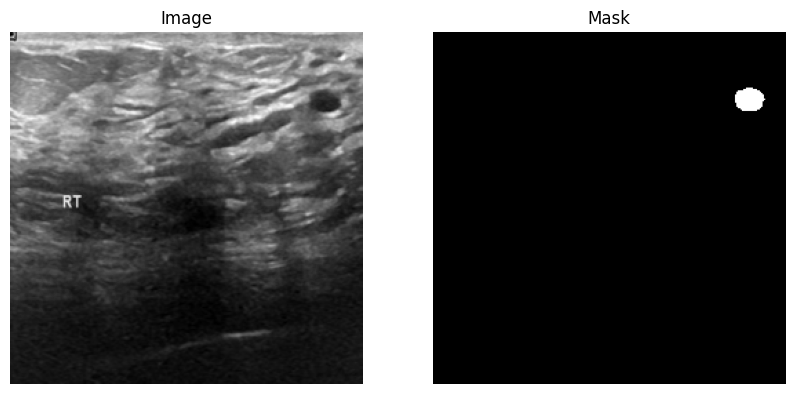

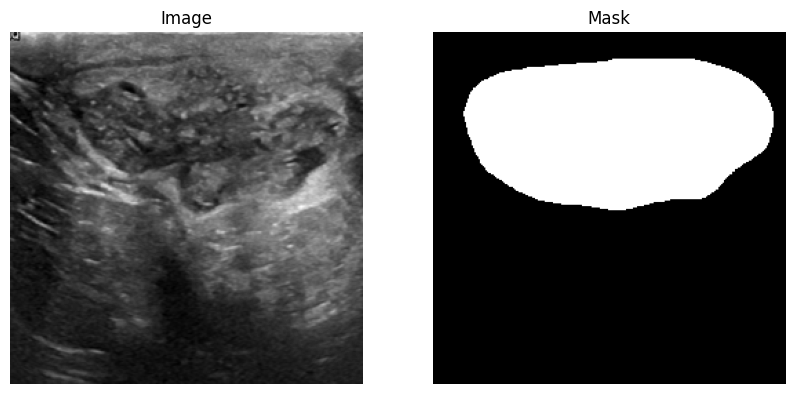


Displaying samples from Dataset 32:


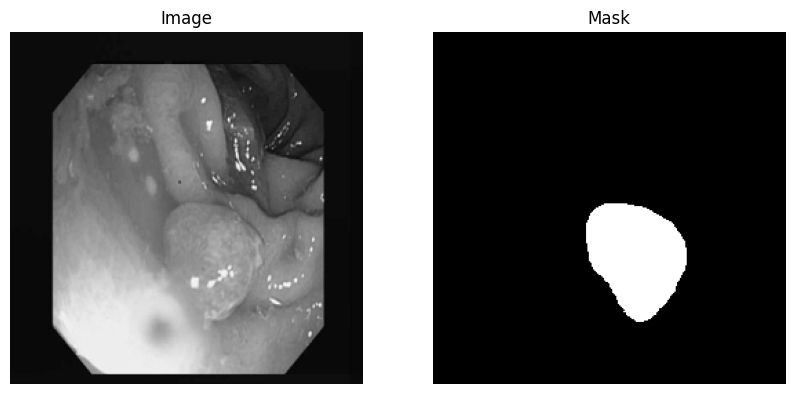

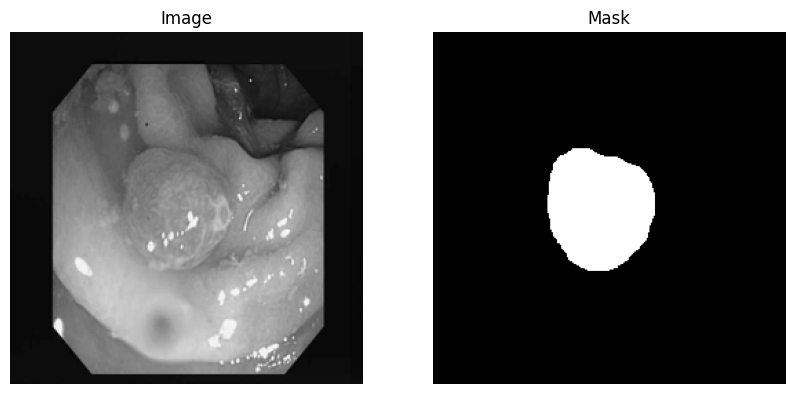


Displaying samples from Dataset 33:


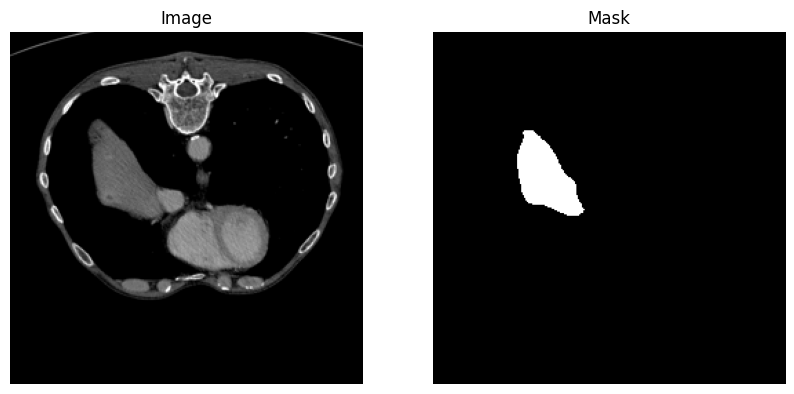

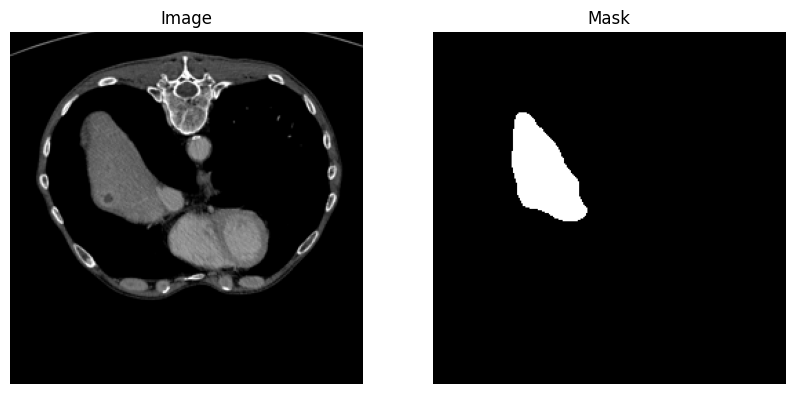


Displaying samples from Dataset 34:


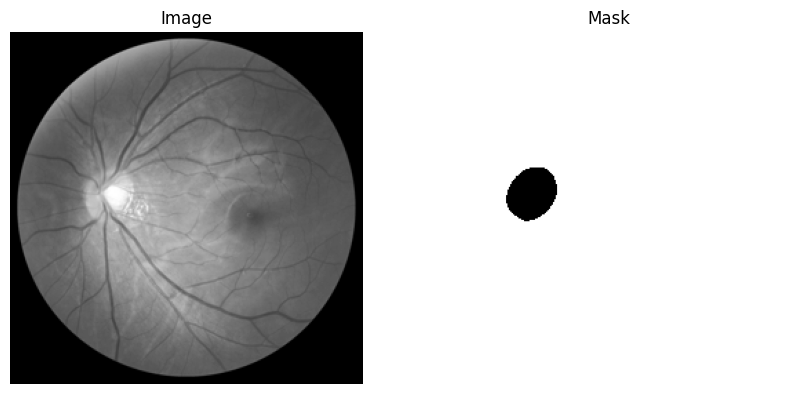

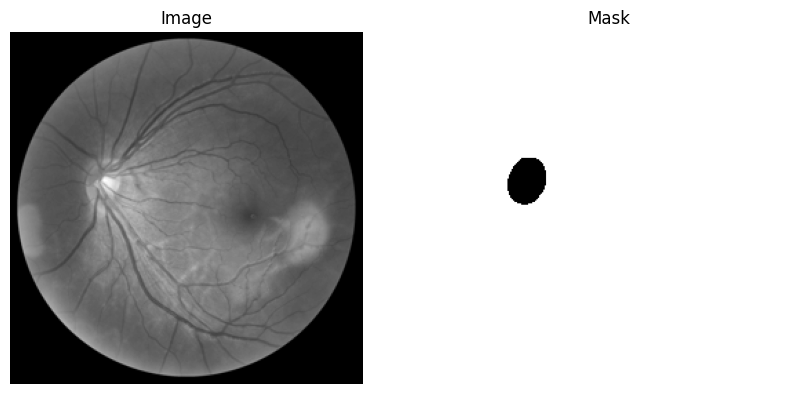


Displaying samples from Dataset 35:


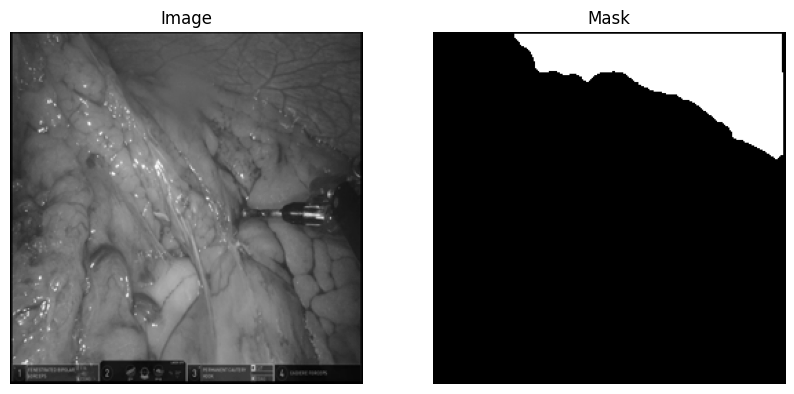

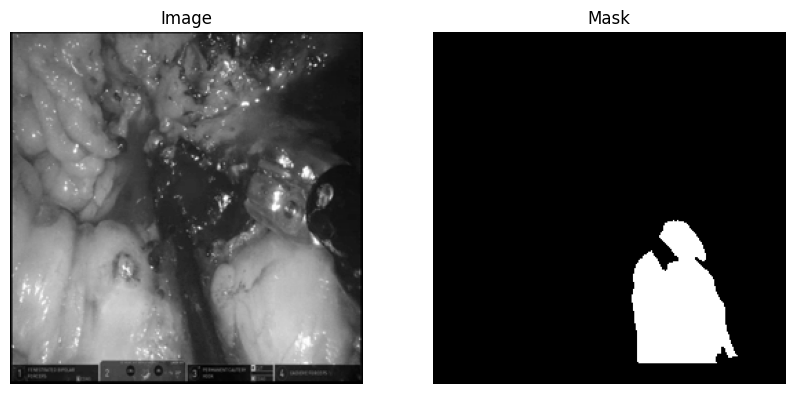


Displaying samples from Dataset 36:


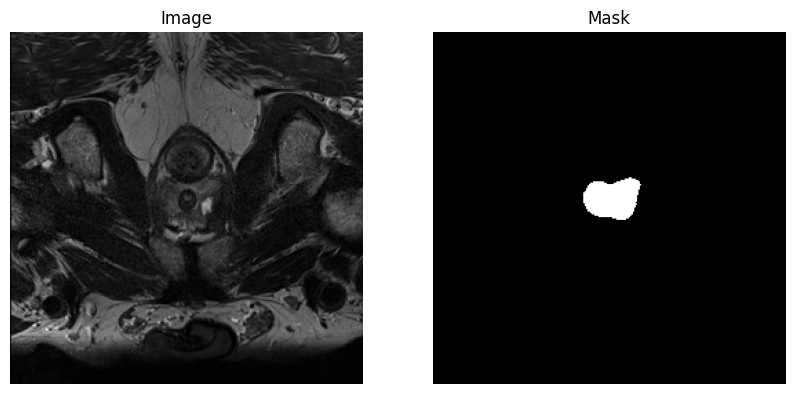

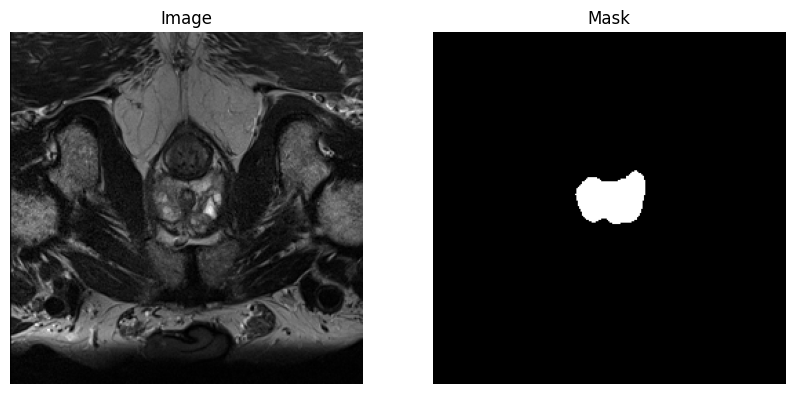


Displaying samples from Dataset 37:


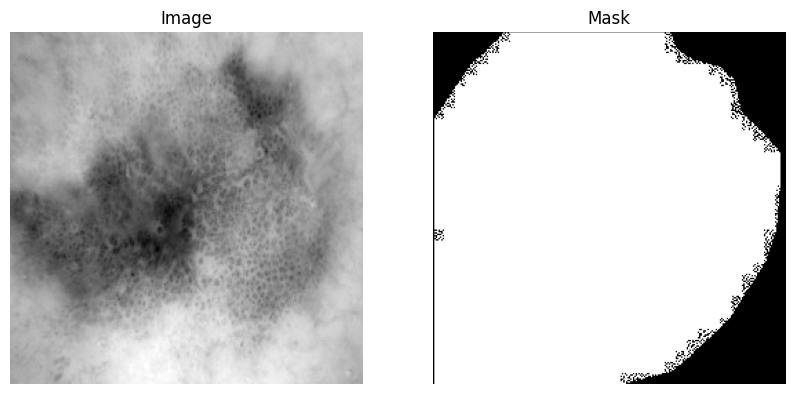

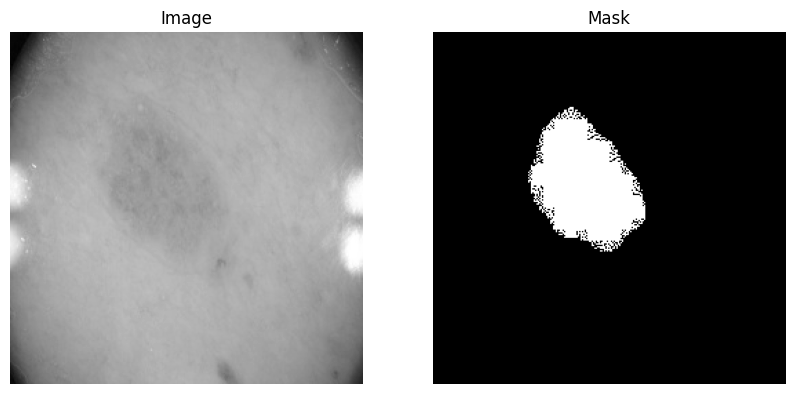


Displaying samples from Dataset 38:


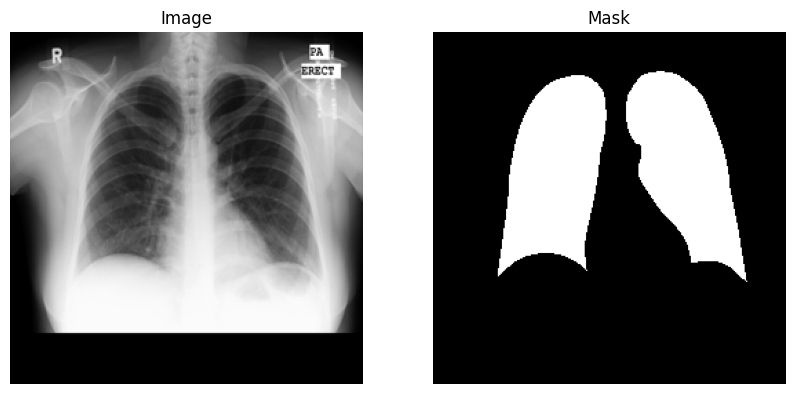

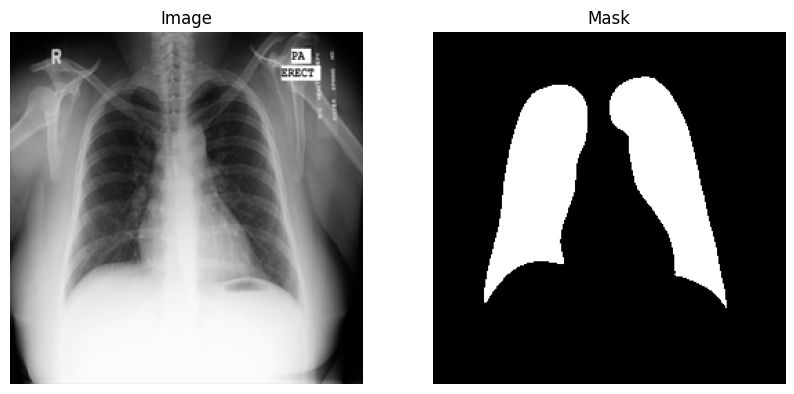


Displaying samples from Dataset 39:


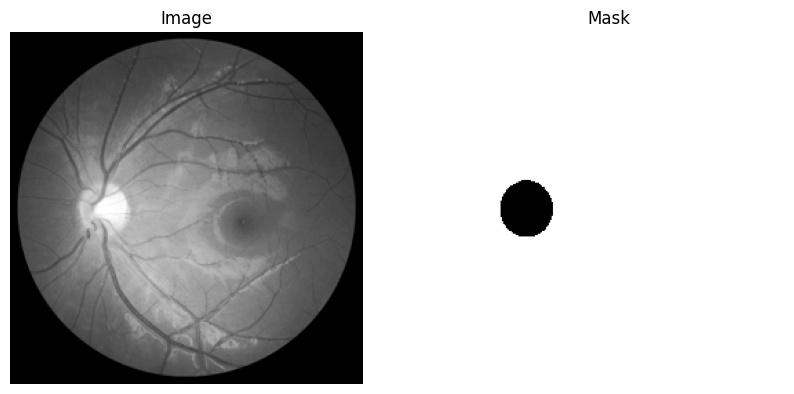

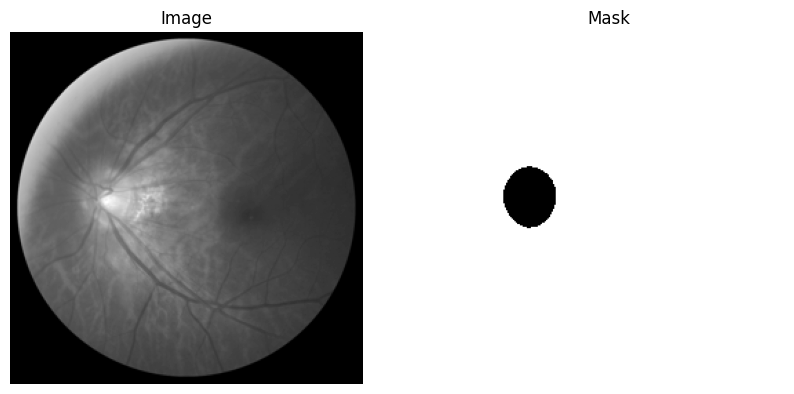


Displaying samples from Dataset 40:


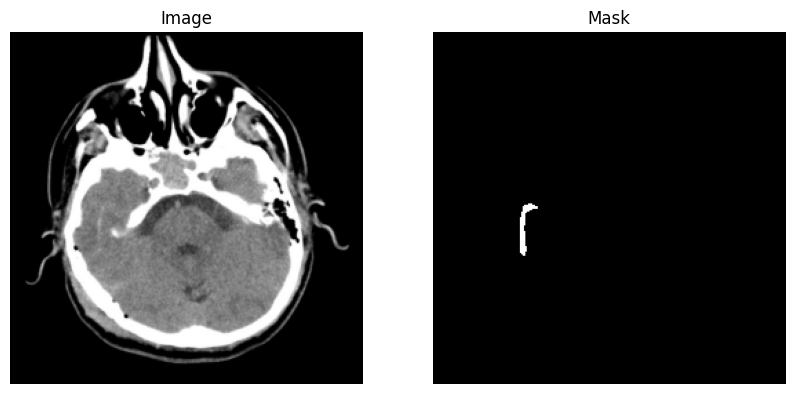

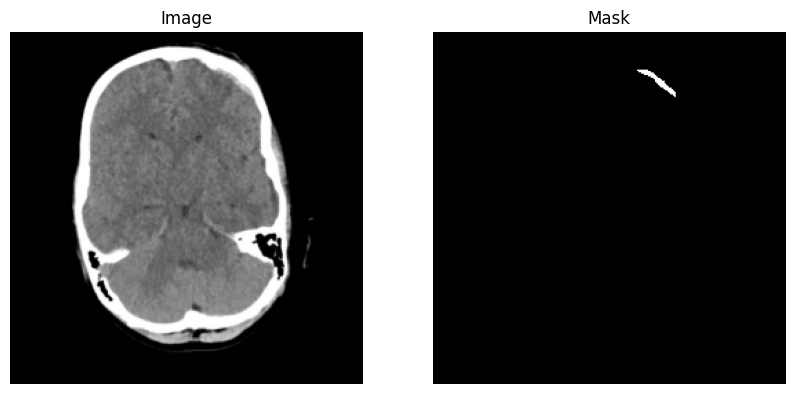


Displaying samples from Dataset 41:


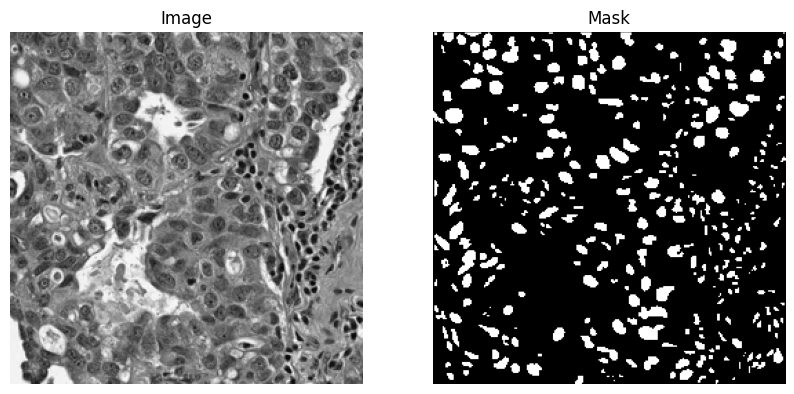

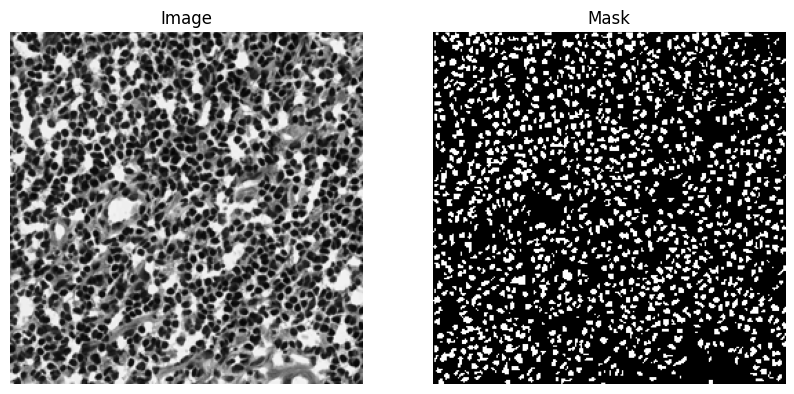


Displaying samples from Dataset 42:


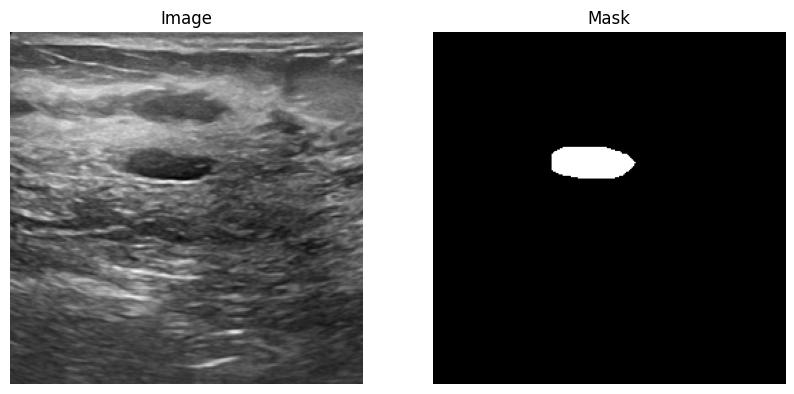

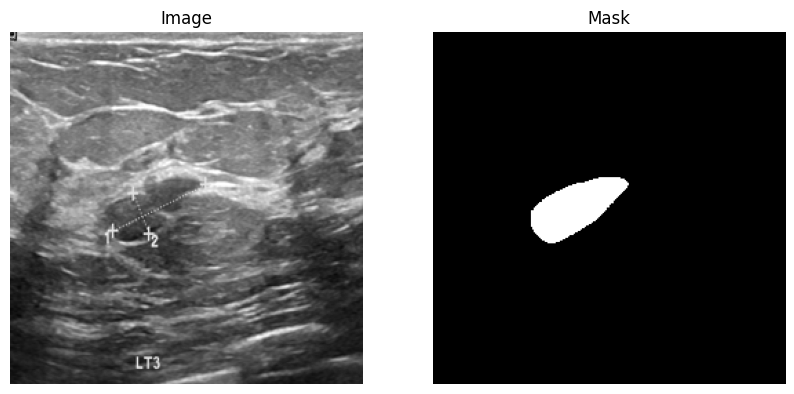


Displaying samples from Dataset 43:


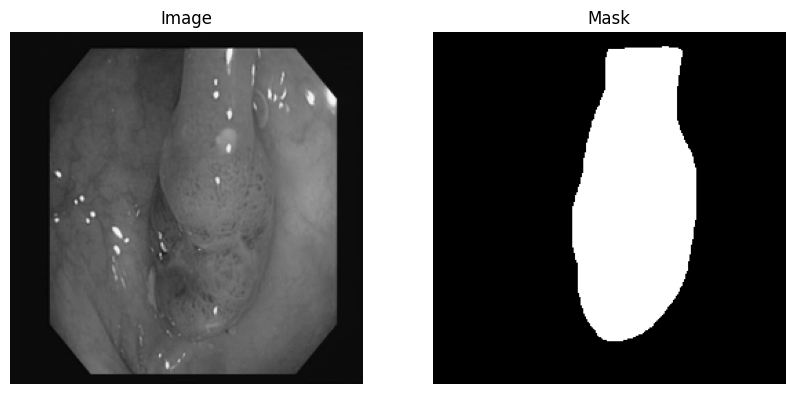

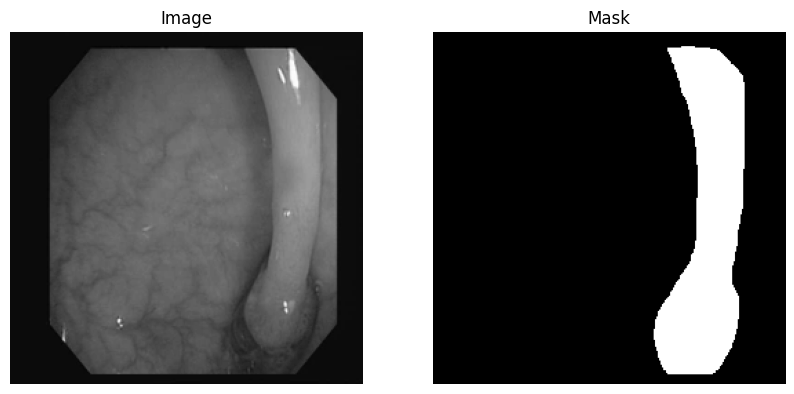


Displaying samples from Dataset 44:


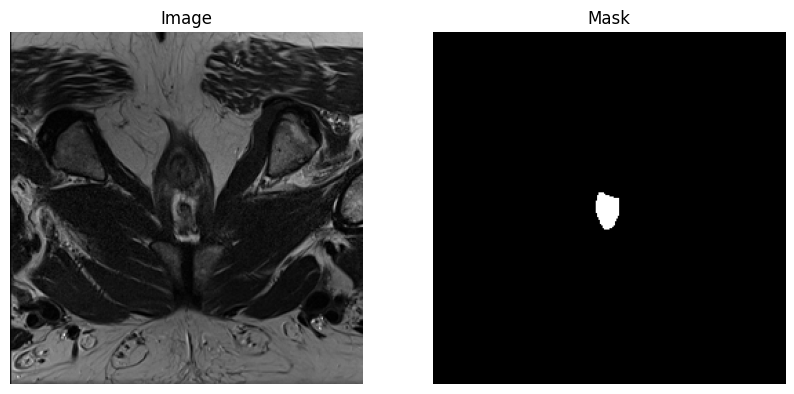

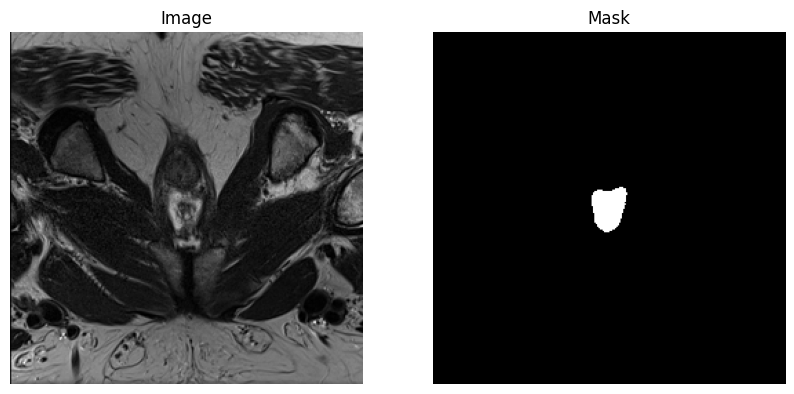


Displaying samples from Dataset 45:


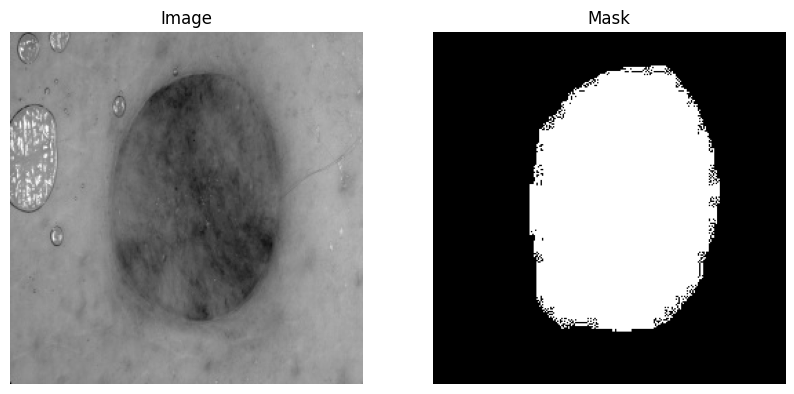

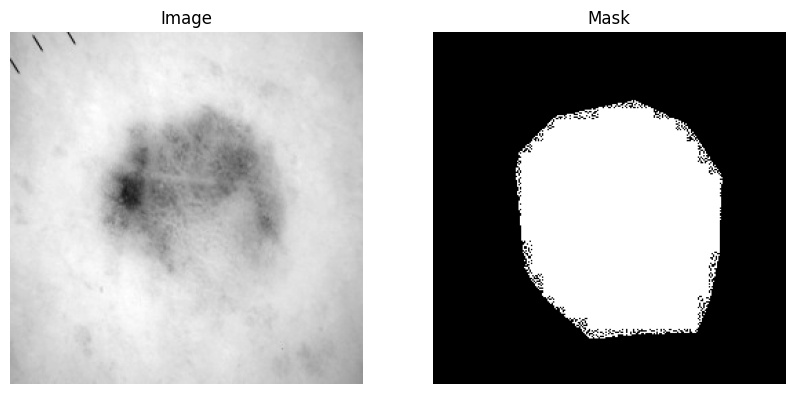


Displaying samples from Dataset 46:


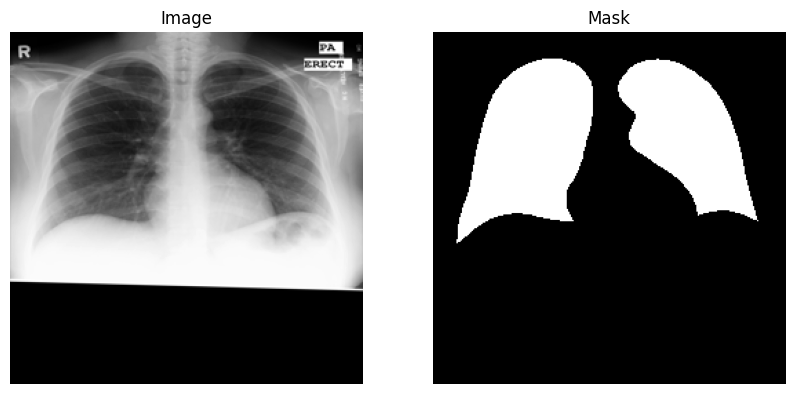

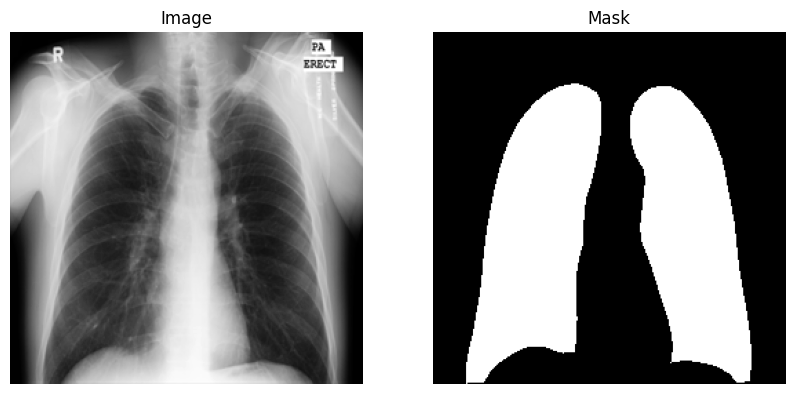

In [ ]:
# Function to display images and masks
def display_images_with_masks(dataset, n=2): # n=2 for 2 images per dataset
    """Display n images and their corresponding masks from a dataset."""
    for i in range(n):
        # Extract the image and mask from the dataset
        sample = dataset[i]
        image = sample['image']  # dataset key 'image' holds the image data
        mask = sample['label']    # dataset key 'label' holds the mask data

        # Display the image and mask
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(image, cmap='gray')
        axes[0].set_title("Image")
        axes[0].axis('off')

        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title("Mask")
        axes[1].axis('off')

        plt.show()

# Display two images and masks from each dataset
for i, dataset in enumerate(datasets):
    print(f"\nDisplaying samples from Dataset {i+1}:")
    display_images_with_masks(dataset, n=2)

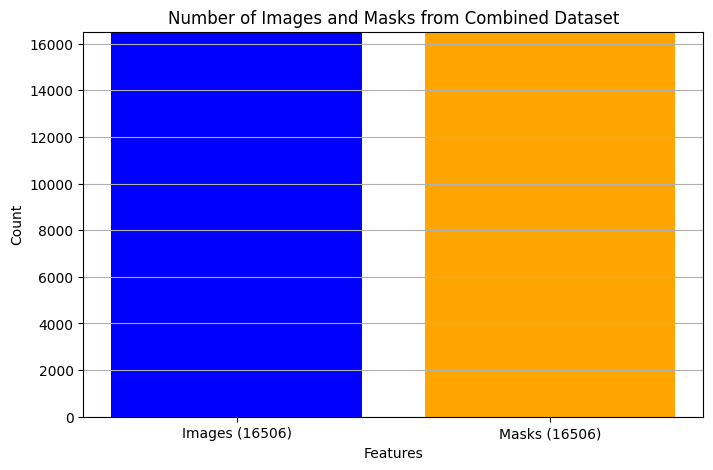

In [ ]:
import matplotlib.pyplot as plt

# "combined_dataset" contains 'image' and 'label' keys, in order to get the number of images and masks
num_images = len(combined_dataset)
num_masks = sum(1 for entry in combined_dataset if entry.get('label') is not None)

# Prepare data for plotting
categories = [f"Images ({num_images})", f"Masks ({num_masks})"]
counts = [num_images, num_masks]

# Create a bar chart
plt.figure(figsize=(8, 5))
plt.bar(categories, counts, color=['blue', 'orange'])
plt.title('Number of Images and Masks from Combined Dataset')
plt.xlabel('Features')
plt.ylabel('Count')
plt.ylim(0, max(counts) + 10)  # add some space above the highest bar
plt.grid(axis='y')

# Show the plot
plt.show()


In [ ]:
import os
import pickle
from datasets import Dataset, concatenate_datasets
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/drive')

# Define the folder path where your .pkl files are stored
folder_path = '/content/drive/MyDrive/COMP700/EfficientSAM/'

# List all .pkl files in the folder
pkl_files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('dataset.pkl')]

# Initialize an empty list to store datasets
datasets = []

# Dictionary to hold dataset names and their corresponding modalities
datasets_modalities = {
    "kvasir_dataset": "Endoscopy",
    "cvc_clinic_dataset": "Colonoscopy",
    "busi_dataset": "Ultrasound",
    "monuseg_dataset": "Endoscopy",
    "physionet_dataset": "Cardiac",
    "retina_dataset": "Fundus",
    "chestxray_dataset": "X-ray",
    "liverseg_dataset": "CT",
    "heart_ct_dataset": "CT",
    "ctbrain_mrct_dataset": "CT/MRI",
    "mrbrain_mrct_dataset": "MRI",
    "colondb_dataset": "Colonoscopy",
    "etis_polyp_dataset": "Colonoscopy",
    "kvasir_sessile_dataset": "Endoscopy",
    "cvc_tif_dataset": "Colonoscopy",
    "polyp_seg_dataset": "Colonoscopy",
    "polypdb_bli_dataset": "Endoscopy",
    "polypdb_fice_dataset": "Endoscopy",
    "polypdb_lci_dataset": "Endoscopy",
    "polypdb_nbi_dataset": "Endoscopy",
    "polypdb_wli_dataset": "Endoscopy",
    "busi_synthetic_dataset": "Ultrasound",
    "refuge_dataset": "Fundus",
    "abdominal_organseg_dataset": "CT",
    "promise_dataset": "MRI",
    "isic_dataset": "Dermoscopy",
    "montgomery_chest_dataset": "X-ray",
    "retina_test_dataset": "Fundus",
    "physionet_test_dataset": "Cardiac",
    "monuseg_test_dataset": "Endoscopy",
    "busi_test_dataset": "Ultrasound",
    "cvc_clinic_test_dataset": "Colonoscopy",
    "liverseg_test_dataset": "CT",
    "refuge_test_dataset": "Fundus",
    "abdominal_organseg_test_dataset": "CT",
    "promise_test_dataset": "MRI",
    "isic_test_dataset": "Dermoscopy",
    "montgomery_chest_test_dataset": "X-ray",
    "refuge_valid_dataset": "Fundus",
    "physionet_valid_dataset": "Cardiac",
    "monuseg_valid_dataset": "Endoscopy",
    "busi_valid_dataset": "Ultrasound",
    "cvc_clinic_valid_dataset": "Colonoscopy",
    "promise_valid_dataset": "MRI",
    "isic_valid_dataset": "Dermoscopy",
    "montgomery_chest_valid_dataset": "X-ray",
}


# Dictionary to hold counts of images in each dataset
image_counts = {}

# Loop through each .pkl file and load the dataset
for pkl_file in pkl_files:
    dataset_name = os.path.basename(pkl_file).replace('.pkl', '')
    with open(pkl_file, 'rb') as f:
        dataset_dict = pickle.load(f)

        # Count the number of images ('image' key holds the images)
        if 'image' in dataset_dict:
            image_count = len(dataset_dict['image'])
            image_counts[dataset_name] = image_count


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


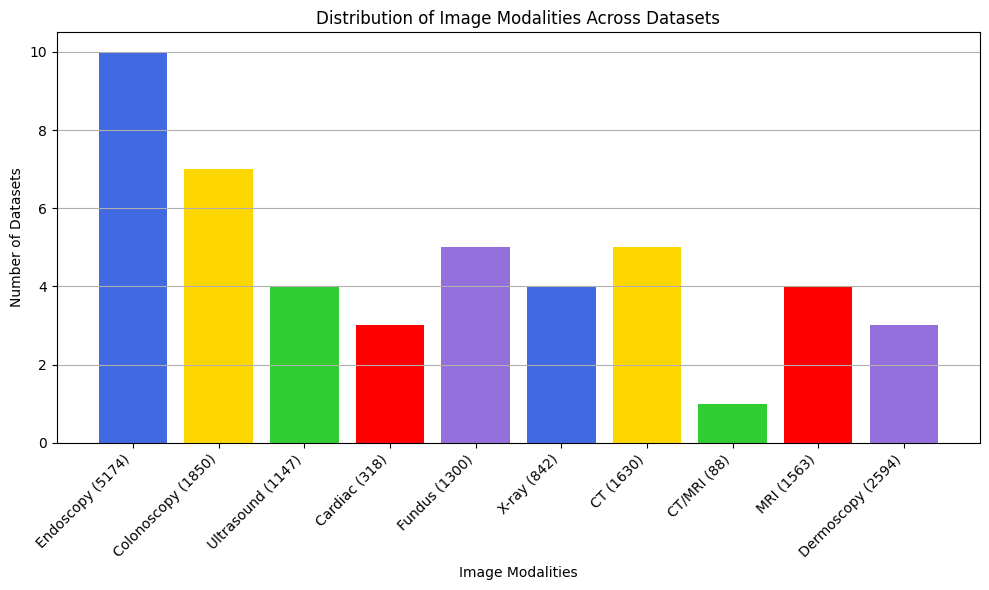

In [ ]:
# Count the frequency of each modality and sum the number of images
modality_counts = {}
modality_image_counts = {}

for dataset_name in datasets_modalities.keys():
    modality = datasets_modalities[dataset_name]
    image_count = image_counts.get(dataset_name, 0)

    if modality in modality_counts:
        modality_counts[modality] += 1
        modality_image_counts[modality] += image_count
    else:
        modality_counts[modality] = 1
        modality_image_counts[modality] = image_count

# Prepare data for plotting modalities
modalities = list(modality_counts.keys())
modality_values = list(modality_counts.values())
modalities_with_counts = [f"{modality} ({modality_image_counts[modality]})" for modality in modalities]

# Create a bar chart for modalities
plt.figure(figsize=(10, 6))
plt.bar(modalities_with_counts, modality_values, color=['royalblue', 'gold', 'limegreen', 'red', 'mediumpurple'])
plt.title('Distribution of Image Modalities Across Datasets')
plt.xlabel('Image Modalities')
plt.ylabel('Number of Datasets')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y')

# Show the modalities plot
plt.tight_layout()
plt.show()


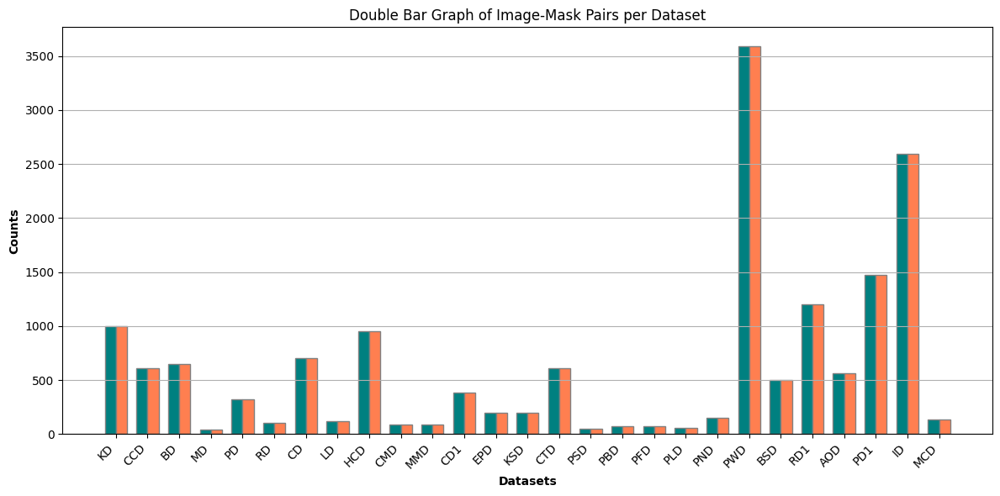

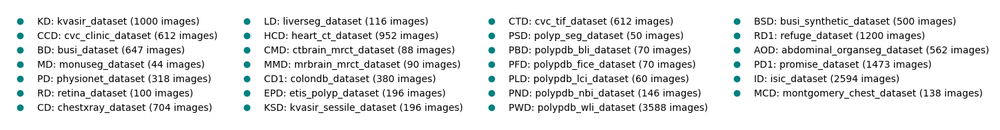

In [ ]:
import os
import pickle
from datasets import Dataset
from google.colab import drive
import matplotlib.pyplot as plt
import numpy as np

# Dictionary to hold counts of images and masks in each dataset
image_counts = {}
mask_counts = {}

# Loop through each .pkl file and load the dataset
for pkl_file in pkl_files:
    dataset_name = os.path.basename(pkl_file).replace('.pkl', '')
    with open(pkl_file, 'rb') as f:
        dataset_dict = pickle.load(f)

        # Count the number of images and masks
        if 'image' in dataset_dict:
            if dataset_name.endswith("_test_dataset") or dataset_name.endswith("_valid_dataset"):
                base_name = dataset_name.rsplit('_', 2)[0] + "_dataset"
                image_counts[base_name] = image_counts.get(base_name, 0) + len(dataset_dict['image'])
            else:
                image_counts[dataset_name] = len(dataset_dict['image'])

        if 'label' in dataset_dict:
            if dataset_name.endswith("_test_dataset") or dataset_name.endswith("_valid_dataset"):
                base_name = dataset_name.rsplit('_', 2)[0] + "_dataset"
                mask_counts[base_name] = mask_counts.get(base_name, 0) + len(dataset_dict['label'])
            else:
                mask_counts[dataset_name] = len(dataset_dict['label'])

# Generate acronyms for datasets
def create_acronym(name, existing_acronyms):
    acronym = ''.join([word[0].upper() for word in name.split('_')])

    # Check for duplicates and append a number if needed
    if acronym in existing_acronyms:
        count = 1
        new_acronym = f"{acronym}{count}"
        while new_acronym in existing_acronyms:
            count += 1
            new_acronym = f"{acronym}{count}"
        acronym = new_acronym


    existing_acronyms.add(acronym)
    return acronym


# Prepare data for plotting
dataset_names = list(image_counts.keys())
existing_acronyms = set()
acronyms = [create_acronym(name, existing_acronyms) for name in dataset_names]
image_counts_values = list(image_counts.values())
mask_counts_values = [mask_counts.get(name, 0) for name in dataset_names]

# Set positions and width for the bars
bar_width = 0.35
r1 = np.arange(len(acronyms))
r2 = [x + bar_width for x in r1]

# Create the double bar chart
plt.figure(figsize=(12, 6))
plt.bar(r1, image_counts_values, color='teal', width=bar_width, edgecolor='grey', label='Number of Images')
plt.bar(r2, mask_counts_values, color='coral', width=bar_width, edgecolor='grey', label='Number of Masks')

# Add labels and title
plt.xlabel('Datasets', fontweight='bold')
plt.ylabel('Counts', fontweight='bold')
plt.xticks([r + bar_width / 2 for r in range(len(acronyms))], acronyms, rotation=45, ha='right')
plt.title('Double Bar Graph of Image-Mask Pairs per Dataset')

# Remove the legend from the plot to show it separately
plt.grid(axis='y')
plt.tight_layout()
plt.show()

# Create a separate legend figure with 4 columns
fig2, ax2 = plt.subplots(figsize=(10, 2))  # makes the figure vertically narrow
ax2.axis('off')  # turn off axes for the legend-only plot

# Create legend entries
for i, (dataset_name, acronym) in enumerate(zip(dataset_names, acronyms)):
    ax2.plot([], [], label=f"{acronym}: {dataset_name} ({image_counts[dataset_name]} images)",
             marker='o', color='teal', linestyle='None')

# Display the legend with 4 columns
ax2.legend(loc='center', ncol=4, fontsize=10, frameon=False)  # 4 equal columns
plt.tight_layout()
plt.show()


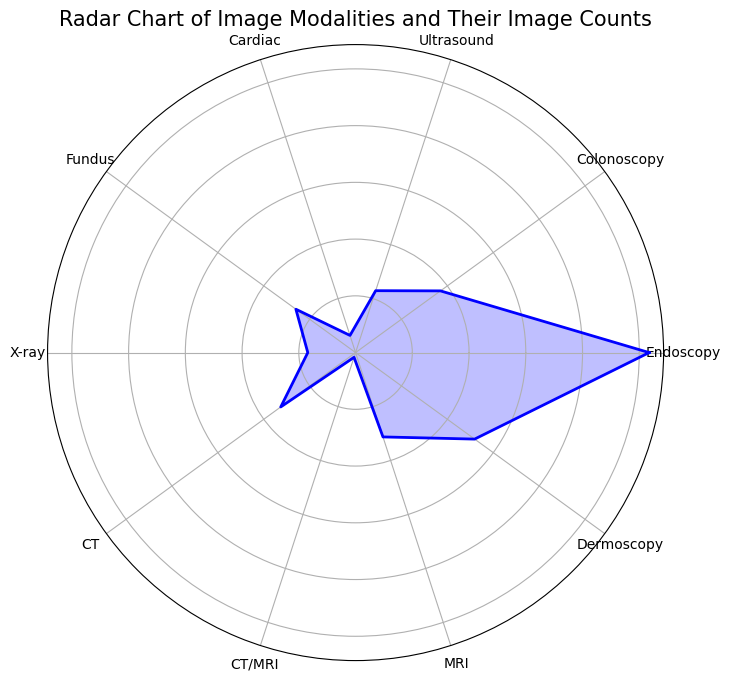

In [ ]:
import os
import pickle
from datasets import Dataset
from google.colab import drive
import matplotlib.pyplot as plt
import numpy as np

# Dictionary to hold counts of images in each dataset
image_counts = {}

# Loop through each .pkl file and load the dataset
for pkl_file in pkl_files:
    dataset_name = os.path.basename(pkl_file).replace('.pkl', '')
    with open(pkl_file, 'rb') as f:
        dataset_dict = pickle.load(f)

        # Count the number of images
        if 'image' in dataset_dict:
            image_count = len(dataset_dict['image'])
            image_counts[dataset_name] = image_count

# Count the frequency of each modality and sum the number of images
modality_counts = {}
modality_image_counts = {}
for dataset_name in datasets_modalities.keys():
    modality = datasets_modalities[dataset_name]
    image_count = image_counts.get(dataset_name, 0)

    if modality in modality_counts:
        modality_counts[modality] += 1
        modality_image_counts[modality] += image_count
    else:
        modality_counts[modality] = 1
        modality_image_counts[modality] = image_count

# Prepare data for radar chart
modalities = list(modality_counts.keys())
image_counts_values = [modality_image_counts[modality] for modality in modalities]

# Number of modalities
num_modalities = len(modalities)

# Create a radar chart
angles = np.linspace(0, 2 * np.pi, num_modalities, endpoint=False).tolist()
image_counts_values += image_counts_values[:1]  # repeat the first value to close the circle
angles += angles[:1]  # repeat the first angle to close the circle

# Create the radar chart
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.fill(angles, image_counts_values, color='blue', alpha=0.25)
ax.plot(angles, image_counts_values, color='blue', linewidth=2)

# Labels for each modality
ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(modalities)

plt.title('Radar Chart of Image Modalities and Their Image Counts', size=15)
plt.show()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


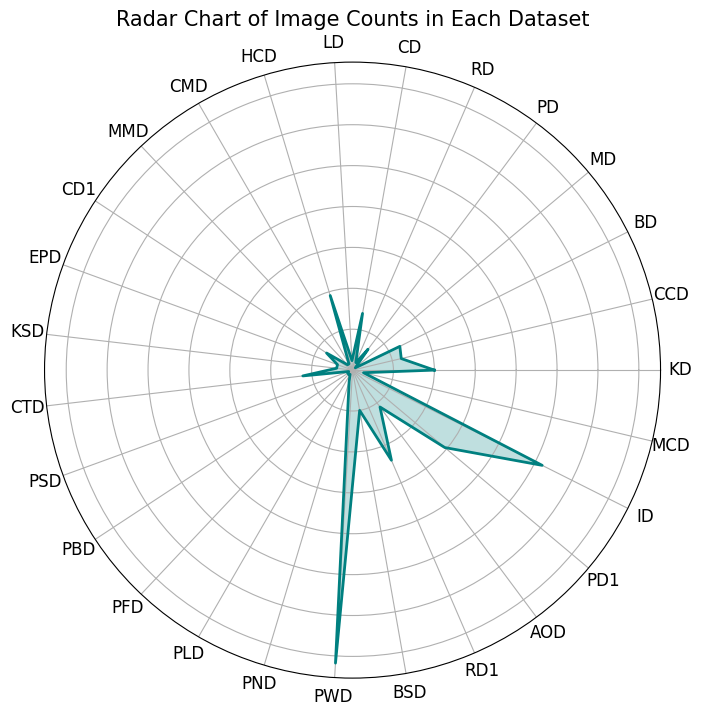

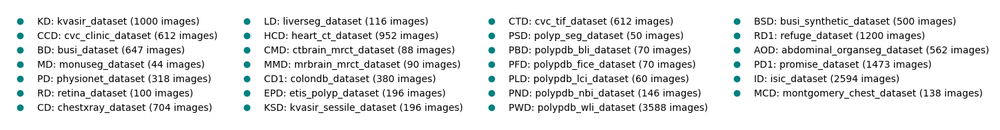

In [ ]:
import os
import pickle
from datasets import Dataset
from google.colab import drive
import matplotlib.pyplot as plt
import numpy as np

# Mount Google Drive
drive.mount('/content/drive')

# Define the folder path where your .pkl files are stored
folder_path = '/content/drive/MyDrive/COMP700/EfficientSAM/'

# List all .pkl files in the folder
pkl_files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('.pkl')]

# Dictionary to hold counts of images in each dataset
image_counts = {}

# Load the datasets and count the images
for pkl_file in pkl_files:
    dataset_name = os.path.basename(pkl_file).replace('.pkl', '')
    with open(pkl_file, 'rb') as f:
        dataset_dict = pickle.load(f)

        if 'image' in dataset_dict:
            image_counts[dataset_name] = len(dataset_dict['image'])

# Create a mapping for test and valid datasets to their base dataset
base_counts = {}
for dataset_name, count in image_counts.items():
    # Map test and valid datasets to their base dataset
    if dataset_name.endswith("_test_dataset") or dataset_name.endswith("_valid_dataset"):
        base_name = dataset_name.rsplit('_', 2)[0] + "_dataset"  # get the base name from google drive name using regular expression (e.g., "busi_dataset" from "busi_train_dataset", "busi_valid_dataset", "busi_test_dataset")
        if base_name in base_counts:
            base_counts[base_name] += count  # add count to existing count
        else:
            base_counts[base_name] = count  # initialize count for new base dataset
    else:
        base_counts[dataset_name] = count  # keep original count for train and valid datasets

# Now combine the base counts with original image counts
image_counts = base_counts  # update image_counts to reflect aggregated counts

# Function to generate acronyms from dataset names
def create_acronym(name, existing_acronyms):
    acronym = ''.join([word[0].upper() for word in name.split('_')])

    # Check for duplicates and append a number if needed
    if acronym in existing_acronyms:
        count = 1
        new_acronym = f"{acronym}{count}"
        while new_acronym in existing_acronyms:
            count += 1
            new_acronym = f"{acronym}{count}"
        acronym = new_acronym


    existing_acronyms.add(acronym)
    return acronym


# Prepare data for radar chart
dataset_names = list(image_counts.keys())
existing_acronyms = set()
acronyms = [create_acronym(name, existing_acronyms) for name in dataset_names]
image_counts_values = list(image_counts.values())

# Number of datasets
num_datasets = len(acronyms)

# Create radar chart angles
angles = np.linspace(0, 2 * np.pi, num_datasets, endpoint=False).tolist()
image_counts_values += image_counts_values[:1]  # close the circle
angles += angles[:1]  # close the circle

# Radar chart figure
fig1, ax1 = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax1.fill(angles, image_counts_values, color='teal', alpha=0.25)
ax1.plot(angles, image_counts_values, color='teal', linewidth=2)

# Set the x-axis labels using acronyms
ax1.set_xticks(angles[:-1])
ax1.set_xticklabels(acronyms, size=12)
ax1.set_yticklabels([])  # Hide y-axis labels

ax1.set_title('Radar Chart of Image Counts in Each Dataset', size=15)

# Display radar chart
plt.show()

# Legend figure with 4 columns
fig2, ax2 = plt.subplots(figsize=(10, 2))  # makes sure the figure is vertically narrow
ax2.axis('off')  # turn off axes for the legend-only plot

# Create legend entries
for i, (dataset_name, acronym) in enumerate(zip(dataset_names, acronyms)):
    ax2.plot([], [], label=f"{acronym}: {dataset_name} ({image_counts[dataset_name]} images)",
             marker='o', color='teal', linestyle='None')

# Display the legend with 4 columns
ax2.legend(loc='center', ncol=4, fontsize=10, frameon=False)  # 4 equal columns

plt.tight_layout()
plt.show()


## **2.1. Loading up SAM**

In [ ]:
import numpy as np
from datasets import Dataset, concatenate_datasets

# Get bounding boxes from mask
def get_bounding_box(ground_truth_map):
  y_indices, x_indices = np.where(ground_truth_map > 0)
  if len(y_indices) == 0 or len(x_indices) == 0:
        return [0, 0, 0, 0]

  x_min, x_max = np.min(x_indices), np.max(x_indices)
  y_min, y_max = np.min(y_indices), np.max(y_indices)

  # Add small, intentional changes to bounding box coordinates to help with real-world simulations
  H, W = ground_truth_map.shape
  x_min = max(0, x_min - np.random.randint(0, 20))
  x_max = min(W, x_max + np.random.randint(0, 20))
  y_min = max(0, y_min - np.random.randint(0, 20))
  y_max = min(H, y_max + np.random.randint(0, 20))
  bbox = [x_min, y_min, x_max, y_max]

  return bbox

class SAMDataset(Dataset):
    """
    This class is used to create a dataset that serves input images and masks.
    It takes a dataset and a processor as input and overrides the __len__ and __getitem__ methods of the Dataset class.
    """
    def __init__(self, dataset, processor):
        self.dataset = dataset
        self.processor = processor

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]
        image = item["image"]
        ground_truth_mask = np.array(item["label"])

        # Convert image to a NumPy array if it is not already
        if isinstance(image, list):
            image = np.array(image)

        # Ensure the image has 3 dimensions (H, W, C)
        if image.ndim == 2:  # if the image is 2D (grayscale)
            image = np.expand_dims(image, axis=-1)  # converts (H, W) to (H, W, 1)
            image = np.repeat(image, 3, axis=-1)  # converts (H, W, 3)

        # Get bounding box prompt
        prompt = get_bounding_box(ground_truth_mask)

        # If the image is grayscale (1 channel), set mean and std to a single value
        if image.shape[-1] == 1:
            mean = [0.5]  # adjust the mean for 1 channel
            std = [0.5]   # adjust the std for 1 channel
        else:
            mean = [0.485, 0.456, 0.406]  # the standard values for RGB respectively
            std = [0.229, 0.224, 0.225]

        # Prepare image and prompt for the model, with the appropriate mean and std
        inputs = self.processor(image, input_boxes=[[prompt]], return_tensors="pt", image_mean=mean, image_std=std)

        # Remove batch dimension which the processor adds by default
        inputs = {k: v.squeeze(0) for k, v in inputs.items()}

        # Add ground truth segmentation
        inputs["ground_truth_mask"] = ground_truth_mask

        return inputs

1. **ONE**

In [ ]:
from torch.utils.data import Dataset

class SAMDataset(Dataset):
  """
  This class is used to create a dataset that serves input images and masks.
  It takes a dataset and a processor as input and overrides the __len__ and __getitem__ methods of the Dataset class.
  """
  def __init__(self, dataset, processor):
    self.dataset = dataset
    self.processor = processor

  def __len__(self):
    return len(self.dataset)

  def __getitem__(self, idx):
    item = self.dataset[idx]
    image = item["image"]
    ground_truth_mask = np.array(item["label"])

    # get bounding box prompt
    prompt = get_bounding_box(ground_truth_mask)

    # prepare image and prompt for the model
    inputs = self.processor(image, input_boxes=[[prompt]], return_tensors="pt")

    # remove batch dimension which the processor adds by default
    inputs = {k:v.squeeze(0) for k,v in inputs.items()}

    # add ground truth segmentation
    inputs["ground_truth_mask"] = ground_truth_mask

    return inputs

2. **TWO**

In [ ]:
class SAMDataset(Dataset):
    def __init__(self, dataset, processor):
        self.dataset = dataset
        self.processor = processor

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]
        image = item["image"]
        ground_truth_mask = np.array(item["label"])

        # Ensure the image has 3 dimensions (H, W, C), add a channel dimension if it's 2D
        if image.ndim == 2:  # if the image is 2D (grayscale), expand it to 3D
            image = np.expand_dims(image, axis=-1)  # converts (H, W) to (H, W, 1)

        # Get bounding box prompt
        prompt = get_bounding_box(ground_truth_mask)

        # Prepare image and prompt for the model
        inputs = self.processor(image, input_boxes=[[prompt]], return_tensors="pt")

        # Remove batch dimension which the processor adds by default
        inputs = {k: v.squeeze(0) for k, v in inputs.items()}

        # Add ground truth segmentation
        inputs["ground_truth_mask"] = ground_truth_mask

        return inputs


3. **THREE**

In [ ]:
class SAMDataset(Dataset):
    def __init__(self, dataset, processor):
        self.dataset = dataset
        self.processor = processor

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]
        image = item["image"]
        ground_truth_mask = np.array(item["label"])

        # Convert image to a NumPy array
        image = np.array(image)

        # Ensure the image has 3 dimensions (H, W, C), add a channel dimension if it's 2D
        if image.ndim == 2:  # if the image is 2D (grayscale), expand it to 3D
            image = np.expand_dims(image, axis=-1)  # converts (H, W) to (H, W, 1)

        # Get bounding box prompt
        prompt = get_bounding_box(ground_truth_mask)

        # Prepare image and prompt for the model
        inputs = self.processor(image, input_boxes=[[prompt]], return_tensors="pt")

        # Remove batch dimension which the processor adds by default
        inputs = {k: v.squeeze(0) for k, v in inputs.items()}

        # Add ground truth segmentation
        inputs["ground_truth_mask"] = ground_truth_mask

        return inputs


4. **FOUR**

In [ ]:
class SAMDataset(Dataset):
    def __init__(self, dataset, processor):
        self.dataset = dataset
        self.processor = processor

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]
        image = item["image"]
        ground_truth_mask = np.array(item["label"])

        # Convert image to a NumPy array
        image = np.array(image)

        # Ensure the image has 3 dimensions (H, W, C), add a channel dimension if it's 2D
        if image.ndim == 2:  # if the image is 2D (grayscale), expand it to 3D
            image = np.expand_dims(image, axis=-1)  # converts (H, W) to (H, W, 1)

        # Get bounding box prompt
        prompt = get_bounding_box(ground_truth_mask)

        # If the image is grayscale (1 channel), set mean and std to a single value
        if image.shape[-1] == 1:
            mean = [0.5]  # adjust the mean for 1 channel
            std = [0.5]   # adjust the std for 1 channel
        else:
            mean = [0.485, 0.456, 0.406]  # standard values for RGB
            std = [0.229, 0.224, 0.225]

        # Prepare image and prompt for the model, with the appropriate mean and std
        inputs = self.processor(image, input_boxes=[[prompt]], return_tensors="pt", image_mean=mean, image_std=std)

        # Remove batch dimension which the processor adds by default
        inputs = {k: v.squeeze(0) for k, v in inputs.items()}

        # Add ground truth segmentation
        inputs["ground_truth_mask"] = ground_truth_mask

        return inputs


5. **FIVE**

In [ ]:
class SAMDataset(Dataset):
    def __init__(self, dataset, processor):
        self.dataset = dataset
        self.processor = processor

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]
        image = item["image"]
        ground_truth_mask = np.array(item["label"])

        # Convert image to a NumPy array
        image = np.array(image)

        # Ensure the image has 3 dimensions (H, W, C), add a channel dimension if it's 2D
        if image.ndim == 2:  # if the image is 2D (grayscale), expand it to 3D
            image = np.expand_dims(image, axis=-1)  # converts (H, W) to (H, W, 1)
            image = np.repeat(image, 3, axis=-1)  # converts (H, W, 1) to (H, W, 3)

        # Get bounding box prompt
        prompt = get_bounding_box(ground_truth_mask)

        # Prepare image and prompt for the model
        inputs = self.processor(image, input_boxes=[[prompt]], return_tensors="pt")

        # Remove batch dimension which the processor adds by default
        inputs = {k: v.squeeze(0) for k, v in inputs.items()}

        # Add ground truth segmentation
        inputs["ground_truth_mask"] = ground_truth_mask

        return inputs


## **2.2. Load the SAM Processor**

In [ ]:
# Initialize the processor
from transformers import SamProcessor
processor = SamProcessor.from_pretrained("facebook/sam-vit-base")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

In [ ]:
# Create an instance of the SAMDataset
train_dataset = SAMDataset(dataset=combined_dataset, processor=processor)

In [ ]:
example = train_dataset[0]
for k,v in example.items():
  print(k,v.shape)


pixel_values torch.Size([3, 1024, 1024])
original_sizes torch.Size([2])
reshaped_input_sizes torch.Size([2])
input_boxes torch.Size([1, 4])
ground_truth_mask (256, 256)


In [ ]:
# Create a DataLoader instance for the training dataset
from torch.utils.data import DataLoader
train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True, drop_last=False)

In [ ]:
batch = next(iter(train_dataloader))
for k,v in batch.items():
  print(k,v.shape)

pixel_values torch.Size([2, 3, 1024, 1024])
original_sizes torch.Size([2, 2])
reshaped_input_sizes torch.Size([2, 2])
input_boxes torch.Size([2, 1, 4])
ground_truth_mask torch.Size([2, 256, 256])


In [ ]:
batch["ground_truth_mask"].shape

torch.Size([2, 256, 256])

## **2.3. Load the SAM Model**

In [ ]:
# Load the model
from transformers import SamModel
model = SamModel.from_pretrained("facebook/sam-vit-base")

# Make sure we only compute gradients for mask decoder
for name, param in model.named_parameters():
  if name.startswith("vision_encoder") or name.startswith("prompt_encoder"):
    param.requires_grad_(False)

config.json:   0%|          | 0.00/6.57k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/375M [00:00<?, ?B/s]

# **3. Fine-Tuning SAM**

Use AdamOptimizer and Custom Loss Functions defined in MONAI for Fine-Tuning

In [ ]:
combined_dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 13988
})

In [ ]:
from torch.optim import Adam
import monai

# Initialize the optimizer and the loss function
optimizer = Adam(model.mask_decoder.parameters(), lr=1e-5, weight_decay=0)

# Try DiceFocalLoss, FocalLoss, DiceCELoss
seg_loss = monai.losses.DiceCELoss(sigmoid=True, squared_pred=True, reduction='mean')

## Original Fine-Tuning

In [ ]:
from tqdm import tqdm
from statistics import mean
import torch
from torch.nn.functional import threshold, normalize

# Training loop
num_epochs = 100

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

model.train()
for epoch in range(num_epochs):
    epoch_losses = []
    for batch in tqdm(train_dataloader):
      # Forward pass
      outputs = model(pixel_values=batch["pixel_values"].to(device),
                      input_boxes=batch["input_boxes"].to(device),
                      multimask_output=False)

      # Compute loss
      predicted_masks = outputs.pred_masks.squeeze(1)
      ground_truth_masks = batch["ground_truth_mask"].float().to(device)
      loss = seg_loss(predicted_masks, ground_truth_masks.unsqueeze(1))

      # Backward pass (compute gradients of parameters w.r.t. loss)
      optimizer.zero_grad()
      loss.backward()

      # Optimize
      optimizer.step()
      epoch_losses.append(loss.item())

    print(f'EPOCH: {epoch}')
    print(f'Mean loss: {mean(epoch_losses)}\n')

 24%|██▍       | 1672/6994 [26:35<1:24:37,  1.05it/s]


KeyboardInterrupt: 

## **3.1. Fine-Tuning using Mixed Precision Training**

### Attempt 1

In [ ]:
import torch

from torch.amp import autocast, GradScaler
from tqdm import tqdm
from statistics import mean
from torch.nn.functional import threshold, normalize


# Training loop
num_epochs = 100

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

# Initialize the gradient scaler
scaler = GradScaler(device_type=device)

model.train()
for epoch in range(num_epochs):
    epoch_losses = []
    for batch in tqdm(train_dataloader):
        # Forward pass with mixed precision
        with autocast():
            outputs = model(pixel_values=batch["pixel_values"].to(device),
                            input_boxes=batch["input_boxes"].to(device),
                            multimask_output=False)
            # Compute loss
            predicted_masks = outputs.pred_masks.squeeze(1)
            ground_truth_masks = batch["ground_truth_mask"].float().to(device)
            loss = seg_loss(predicted_masks, ground_truth_masks.unsqueeze(1))

        # Backward pass (compute gradients of parameters w.r.t. loss)
        optimizer.zero_grad()
        scaler.scale(loss).backward()

        # Optimize
        scaler.step(optimizer)
        scaler.update()
        epoch_losses.append(loss.item())

    print(f'EPOCH: {epoch}')
    print(f'Mean loss: {mean(epoch_losses)}\n')


<ipython-input-29-77c698d48415>:4: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
  0%|          | 0/6994 [00:00<?, ?it/s]<ipython-input-29-77c698d48415>:11: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
100%|██████████| 6994/6994 [1:02:03<00:00,  1.88it/s]


EPOCH: 0
Mean loss: 0.17927184219924588



 17%|█▋        | 1194/6994 [10:28<50:16,  1.92it/s]

### Attempt 2

In [ ]:
import os
import torch

from torch.amp import autocast, GradScaler
from tqdm import tqdm
from statistics import mean

# Training Loop
num_epochs = 100

# Device Selection
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

# Initialize the Gradient Scaler
scaler = GradScaler()

# Set the directory to save the model checkpoints
save_dir = '/content/drive/MyDrive/COMP700/EfficientSAM/SAM_Checkpoints'
os.makedirs(save_dir, exist_ok=True)  # create the directory if "save_dir" does not exist

# Function to load the latest checkpoint if available
def load_checkpoint(model, optimizer, scaler, checkpoint_dir):
    checkpoints = [file for file in os.listdir(checkpoint_dir) if file.endswith('.pth')]
    if not checkpoints:
        return 0  # return 0 if no checkpoint was found, i.e. start from scratch

    # Find the latest checkpoint (by epoch number)
    latest_checkpoint = max(checkpoints, key=lambda x: int(x.split('_')[-1].split('.')[0]))
    checkpoint_path = os.path.join(checkpoint_dir, latest_checkpoint)

    # Load the checkpoint
    checkpoint = torch.load(checkpoint_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    scaler.load_state_dict(checkpoint['scaler_state_dict'])  # load the scaler state
    start_epoch = checkpoint['epoch'] + 1  # start from the next epoch
    print(f"Loaded checkpoint from {checkpoint_path}, resuming training from epoch {start_epoch}.")
    return start_epoch

# Load checkpoint (if available)
start_epoch = load_checkpoint(model, optimizer, scaler, save_dir)

# Training loop with resuming capability
model.train()
for epoch in range(start_epoch, num_epochs):
    epoch_losses = []
    for batch in tqdm(train_dataloader):
        # Forward pass with mixed precision
        with autocast(device_type=device):
            outputs = model(pixel_values=batch["pixel_values"].to(device),
                            input_boxes=batch["input_boxes"].to(device),
                            multimask_output=False)

            # Compute loss
            predicted_masks = outputs.pred_masks.squeeze(1)
            ground_truth_masks = batch["ground_truth_mask"].float().to(device)
            loss = seg_loss(predicted_masks, ground_truth_masks.unsqueeze(1))

        # Backward pass (compute gradients of parameters w.r.t. loss)
        optimizer.zero_grad()
        scaler.scale(loss).backward()

        # Optimize
        scaler.step(optimizer)
        scaler.update()
        epoch_losses.append(loss.item())

    # Save model checkpoint after each epoch
    checkpoint_path = os.path.join(save_dir, f'model_epoch_{epoch}.pth')
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scaler_state_dict': scaler.state_dict(),  # save scaler state for mixed precision
        'loss': mean(epoch_losses),
    }, checkpoint_path)

    print(f'Saved model checkpoint at epoch {epoch} to {checkpoint_path}')
    print(f'EPOCH: {epoch}')
    print(f'Mean loss: {mean(epoch_losses)}\n')


<ipython-input-20-f9d0f5b9158a>:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path)


Loaded checkpoint from /content/drive/MyDrive/COMP700/EfficientSAM/SAM_Checkpoints/model_epoch_12.pth, resuming training from epoch 13.


100%|██████████| 6994/6994 [1:07:56<00:00,  1.72it/s]


Saved model checkpoint at epoch 13 to /content/drive/MyDrive/COMP700/EfficientSAM/SAM_Checkpoints/model_epoch_13.pth
EPOCH: 13
Mean loss: 0.12314612456763305



100%|██████████| 6994/6994 [1:07:44<00:00,  1.72it/s]


Saved model checkpoint at epoch 14 to /content/drive/MyDrive/COMP700/EfficientSAM/SAM_Checkpoints/model_epoch_14.pth
EPOCH: 14
Mean loss: 0.1216710492831604



100%|██████████| 6994/6994 [1:07:32<00:00,  1.73it/s]


Saved model checkpoint at epoch 15 to /content/drive/MyDrive/COMP700/EfficientSAM/SAM_Checkpoints/model_epoch_15.pth
EPOCH: 15
Mean loss: 0.1199328242963086



  0%|          | 17/6994 [00:10<1:09:48,  1.67it/s]


ValueError: Unable to create tensor, you should probably activate padding with 'padding=True' to have batched tensors with the same length.

## **3.2. Save the model's state dictionary to a file**

In [ ]:
torch.save(model.state_dict(), "/content/drive/MyDrive/COMP700/EfficientSAM/sam_model_checkpoint_10.pth")

# **4. Performing Inference on SAM**

In [ ]:
from transformers import SamModel, SamConfig, SamProcessor
import torch

# Load the model configuration
model_config = SamConfig.from_pretrained("facebook/sam-vit-base")
processor = SamProcessor.from_pretrained("facebook/sam-vit-base")

# Create an instance of the model architecture with the loaded configuration
my_model = SamModel(config=model_config)

# Update the model by loading the weights from saved file
my_model.load_state_dict(torch.load("/content/drive/MyDrive/COMP700/EfficientSAM/SAM_Checkpoints/model_epoch_14.pth"))

In [ ]:
# Set the device to cuda if available, otherwise use cpu
device = "cuda" if torch.cuda.is_available() else "cpu"
my_model.to(device)

SamModel(
  (shared_image_embedding): SamPositionalEmbedding()
  (vision_encoder): SamVisionEncoder(
    (patch_embed): SamPatchEmbeddings(
      (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (layers): ModuleList(
      (0-11): 12 x SamVisionLayer(
        (layer_norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): SamVisionAttention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (proj): Linear(in_features=768, out_features=768, bias=True)
        )
        (layer_norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): SamMLPBlock(
          (lin1): Linear(in_features=768, out_features=3072, bias=True)
          (lin2): Linear(in_features=3072, out_features=768, bias=True)
          (act): GELUActivation()
        )
      )
    )
    (neck): SamVisionNeck(
      (conv1): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (layer_norm1): SamLayerNorm()
     

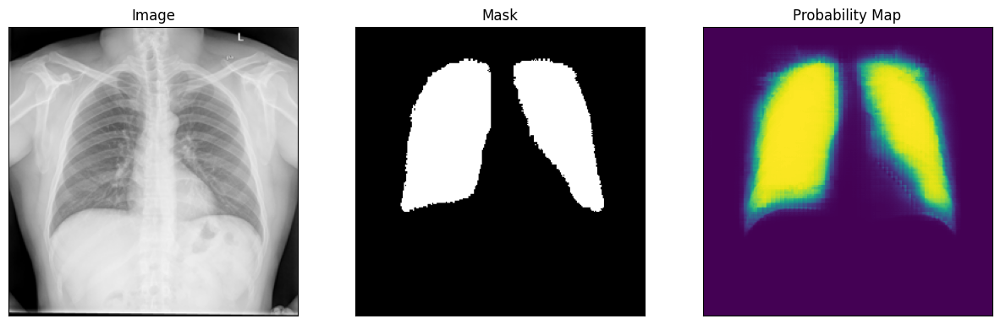

In [ ]:
import numpy as np
import random
import torch
import matplotlib.pyplot as plt

from PIL import Image

# Take a random training example
idx = random.randint(0, len(dataset)-1)

# Load image
test_image = dataset[idx]["image"]

# Get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(dataset[idx]["label"])
prompt = get_bounding_box(ground_truth_mask)

# Convert the test image to a NumPy array
test_image = np.array(test_image)

# Convert the test image to a 3D array if it's in grayscale (2D)
if test_image.ndim == 2:  # if the image has only 2 dimensions,
    test_image = np.expand_dims(test_image, axis=-1) # then add a channel dimension

# If using a model expecting RGB input, duplicate the channel if necessary
if test_image.shape[-1] == 1:  # if grayscale,
    test_image = np.repeat(test_image, 3, axis=-1) # then convert to RGB

# Prepare image + box prompt for the model
inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
inputs = {k: v.to(device) for k, v in inputs.items()}

my_model.eval()

# Forward pass
with torch.no_grad():
    outputs = my_model(**inputs, multimask_output=False)

# Apply sigmoid
medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))

# Convert soft mask to hard mask
medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot the first image on the left
axes[0].imshow(np.array(test_image), cmap='gray')  # since the first image is grayscale
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(medsam_seg, cmap='gray')  # since the second image is also grayscale
axes[1].set_title("Mask")

# Plot the second image on the right
axes[2].imshow(medsam_seg_prob)  # since the second image is also grayscale
axes[2].set_title("Probability Map")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()


Now, let us load a new image and segment it using our trained model.

Note that we need to provide some prompt. Since we do not know where the objects are going to be we cannot supply bounding boxes. So let us provide a grid of points as our prompt.

In [ ]:
from patchify import patchify
from PIL import Image
import numpy as np

# Open the image and convert it to a NumPy array
large_test_image_path = '/content/Lung Segmentation/test/CHNCXR_0040_0.png'
large_test_image = np.array(Image.open(large_test_image_path))

# Check the shape of the image
print(f"Shape of large_test_image: {large_test_image.shape}")

# Apply patchify based on image dimensions
if len(large_test_image.shape) == 2:  # if grayscale image
    patches = patchify(large_test_image, (256, 256), step=256)
elif len(large_test_image.shape) == 3:  # if color image
    patches = patchify(large_test_image, (256, 256, 3), step=256)
else:
    raise ValueError("Unsupported image shape.")


Shape of large_test_image: (2941, 3000, 3)


In [ ]:
"""
input_points (torch.FloatTensor of shape (batch_size, num_points, 2)) -
- Input 2D spatial points, this is used by the prompt encoder to encode the prompt and generally yields to much better results.
- The points can be obtained by passing a list of list of list to the processor that will create corresponding torch tensors of dimension 4,
  where:
  : The first dimension is the image batch size,
  : The second dimension is the point batch size (i.e. how many segmentation masks do we want the model to predict per input point),
  : The third dimension is the number of points per segmentation mask (it is possible to pass multiple points for a single mask),
  : and the fourth dimension is the x (vertical) and y (horizontal) coordinates of the point.

- If a different number of points is passed either for each image, or for each mask,
  Then the processor will create “PAD” points that will correspond to the (0, 0) coordinate,
  and the computation of the embedding will be skipped for these points using the labels.
"""

# Define the size of your array
array_size = 256

# Define the size of your grid
grid_size = 10

# Generate the grid points
x = np.linspace(0, array_size-1, grid_size)
y = np.linspace(0, array_size-1, grid_size)

# Generate a grid of coordinates
xv, yv = np.meshgrid(x, y)

# Convert the numpy arrays to lists
xv_list = xv.tolist()
yv_list = yv.tolist()

# Combine the x and y coordinates into a list of list of lists
input_points = [[[int(x), int(y)] for x, y in zip(x_row, y_row)] for x_row, y_row in zip(xv_list, yv_list)]

"""We need to reshape our nxn grid to the expected shape of the input_points tensor (batch_size, point_batch_size, num_points_per_image, 2),
    where:
    : batch_size repr. the number of images you process at once.
    : point_batch_size repr. the number of point sets you have for each image.
    : num_points_per_image repr. the number of points in each set.
    : the 2 represents the x and y coordinates of each point.
"""

input_points = torch.tensor(input_points).view(1, 1, grid_size*grid_size, 2)

# **5. Evaluation**

## **5.1. Model Loss Across Epochs**

In [ ]:
import torch
import os

import numpy as np
import matplotlib.pyplot as plt

from scipy.spatial.distance import directed_hausdorff

<ipython-input-4-41b5f185f0a4>:26: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=torch.device('cpu'))


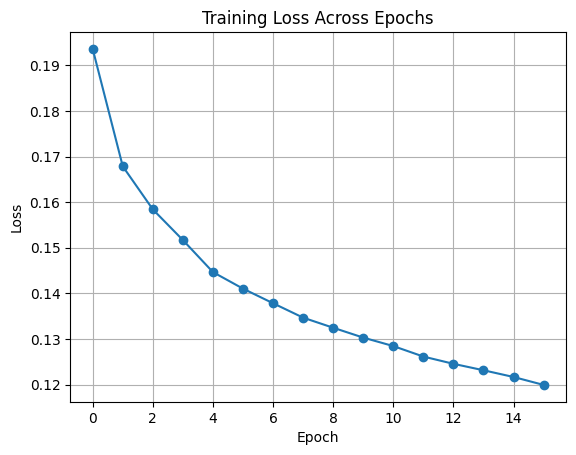

In [ ]:
"""# Load the most recent checkpoint
checkpoint = torch.load('/content/drive/MyDrive/COMP700/EfficientSAM/SAM_Checkpoints/model_epoch_2.pth')

# Access the loss and accuracy values
loss = checkpoint.get('loss')
accuracy = checkpoint.get('accuracy')
epoch = checkpoint.get('epoch')

print(f"Loss: {loss}")
print(f"Accuracy: {accuracy}")
print(f"Epoch: {epoch}")"""


# Directory containing the saved checkpoints
save_dir = '/content/drive/MyDrive/COMP700/EfficientSAM/SAM_Checkpoints'

# Initialize list to store the losses and corresponding epochs
losses = []
epochs = []

# Loop through the checkpoint files and retrieve the losses
checkpoints = [file for file in os.listdir(save_dir) if file.endswith('.pth')]
for checkpoint_file in sorted(checkpoints, key=lambda x: int(x.split('_')[-1].split('.')[0])):
    # Load the checkpoint
    checkpoint_path = os.path.join(save_dir, checkpoint_file)
    checkpoint = torch.load(checkpoint_path, map_location=torch.device('cpu'))

    # Retrieve loss and epoch information
    loss = checkpoint.get('loss')
    epoch = checkpoint.get('epoch')

    if loss is not None and epoch is not None:
        losses.append(loss)
        epochs.append(epoch)

# Plot the training progress
plt.plot(epochs, losses, marker='o')
plt.title('Training Loss Across Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.show()



## **5.2. Model Testing**

### **5.2.1. Load Test Dataset**

In [ ]:
import os
import pickle
from datasets import Dataset, concatenate_datasets
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define the folder path where your .pkl files are stored
folder_path = '/content/drive/MyDrive/COMP700/EfficientSAM/'

# List only .pkl files that end with "test_dataset.pkl" in the folder
pkl_files = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('test_dataset.pkl')]

# Initialize an empty list to store datasets
datasets = []

# Loop through each .pkl file and load the dataset
for pkl_file in pkl_files:
    dataset_name = os.path.basename(pkl_file)  # extract the dataset name
    print(f"Loading Test Dataset: {dataset_name}")
    with open(pkl_file, 'rb') as f:
        dataset_dict = pickle.load(f)
        dataset = Dataset.from_dict(dataset_dict)
        datasets.append(dataset)

# Combine all test datasets into one (if there's more than one)
if len(datasets) > 1:
    combined_test_dataset = concatenate_datasets(datasets)
else:
    combined_test_dataset = datasets[0]  # use the single dataset, since it's the only one

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loading Test Dataset: physionet_test_dataset.pkl


In [ ]:
combined_test_dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 32
})

### **5.2.2. Perform Testing**

In [ ]:
from transformers import SamModel, SamConfig, SamProcessor
import torch

# Load the model checkpoint with proper device mapping
checkpoint_path = "/content/drive/MyDrive/COMP700/EfficientSAM/SAM_Checkpoints/model_epoch_15.pth"
device = "cuda" if torch.cuda.is_available() else "cpu"
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the checkpoint and map it to the appropriate device
checkpoint = torch.load(checkpoint_path) #map_location=torch.device('cpu')

# Load the model configuration
model_config = SamConfig.from_pretrained("facebook/sam-vit-base")
processor = SamProcessor.from_pretrained("facebook/sam-vit-base")

# Create an instance of the model architecture with the loaded configuration
my_model = SamModel(config=model_config)

# Load the state dict from the checkpoint
my_model.load_state_dict(checkpoint['model_state_dict'])



scaler = torch.cuda.amp.GradScaler()
scaler.load_state_dict(checkpoint['scaler_state_dict'])

# Set the model to the correct device (GPU or CPU)
my_model.to(device)

# Access the epoch and loss stored in the checkpoint (if saved)
epoch = checkpoint.get('epoch', 'Not available')
loss = checkpoint.get('loss', 'Not available')
print(f"Checkpoint loaded from epoch: {epoch}")
print(f"Loss at checkpoint: {loss}")
print("Model loaded successfully.")

<ipython-input-37-263b56ec28e4>:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path) #map_location=torch.device('cpu')


Checkpoint loaded from epoch: 15
Loss at checkpoint: 0.1199328242963086
Model loaded successfully.


<ipython-input-37-263b56ec28e4>:24: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()


Define Evaluation Metrics

In [ ]:
import torch
import torch.nn.functional as F
from scipy.spatial.distance import directed_hausdorff
import numpy as np

def compute_metrics(predicted_masks, ground_truth_masks, threshold=0.5):
    # Ensure the predicted and ground truth masks are binary (0,1) based on the specified threshold
    predicted_masks = (predicted_masks > threshold).float()
    ground_truth_masks = (ground_truth_masks > threshold).float()

    # Convert predicted masks to single channel if necessary
    if predicted_masks.shape[1] > 1:
        predicted_masks = predicted_masks[:, 0, :, :]  # use the first channel

    # Check the shapes after conversion
    if predicted_masks.shape != ground_truth_masks.shape:
        raise ValueError(f"Shape mismatch: predicted masks shape {predicted_masks.shape}, "
                         f"ground truth masks shape {ground_truth_masks.shape}")

    # Flatten the masks for metric computation
    predicted_masks_flat = predicted_masks.view(predicted_masks.size(0), -1)
    ground_truth_masks_flat = ground_truth_masks.view(ground_truth_masks.size(0), -1)

    # Compute Dice score = 2|A and B| / (|A| or |B|) --note: division by zero is possible
    intersection = torch.sum(predicted_masks_flat * ground_truth_masks_flat, dim=1)
    dice_score = (2. * intersection) / (torch.sum(predicted_masks_flat, dim=1) + torch.sum(ground_truth_masks_flat, dim=1) + 1e-6) # add a small epsilon to avoid division by zero
    #denominator = torch.sum(predicted_masks_flat, dim=1) + torch.sum(ground_truth_masks_flat, dim=1)
    #dice_score = (2. * intersection) / (denominator)  if denominator > 0 else 0

    # Compute Jaccard Index/IoU = |A and B| / |A or B|) --note: division by zero is possible
    union = torch.sum(predicted_masks_flat + ground_truth_masks_flat, dim=1) - intersection
    jaccard_index = intersection / (union + 1e-6)  # add a small epsilon to avoid division by zero
    #jaccard_index = intersection / union if union > 0 else 0

    # Compute Hausdorff Distance using scipy
    hausdorff_distance = []
    for i in range(predicted_masks.size(0)):
        pred_mask_np = predicted_masks[i].cpu().numpy()
        gt_mask_np = ground_truth_masks[i].cpu().numpy()

        # Get the coordinates of non-zero pixels (point sets)
        pred_coords = np.argwhere(pred_mask_np > 0.5)
        gt_coords = np.argwhere(gt_mask_np > 0.5)

        # Ensure both masks have points and the same dimension
        if pred_coords.shape[1] != gt_coords.shape[1]:
            # If the dimensions don't match, skip and set distance to infinity
            hausdorff_dist = float('inf')
        elif len(pred_coords) == 0 or len(gt_coords) == 0:
            # If either mask is empty, assign a large Hausdorff distance
            hausdorff_dist = float('inf')
        else:
            hausdorff_dist = max(directed_hausdorff(pred_coords, gt_coords)[0],
                                 directed_hausdorff(gt_coords, pred_coords)[0])

        hausdorff_distance.append(hausdorff_dist)

    hausdorff_distance = torch.tensor(hausdorff_distance)

    # Return the computed metrics
    return {
        "dice_score": dice_score.mean().item(),
        "jaccard_index": jaccard_index.mean().item(),
        "hausdorff_distance": hausdorff_distance.mean().item()
    }


In [ ]:
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
from tqdm import tqdm

# Move model to the correct device
model.to(device)

test_dataset = SAMDataset(dataset=combined_test_dataset, processor=processor)

# Create a DataLoader
test_dataloader = DataLoader(test_dataset, batch_size=2, shuffle=False)

# Initialize a list to store the metrics for each batch
metrics_list = []

# Put the model in evaluation mode and disable gradient calculation
model.eval()
with torch.no_grad():
    for batch in tqdm(test_dataloader):
        # Get the inputs and ground truth masks
        pixel_values = batch["pixel_values"].to(device)
        ground_truth_masks = batch["ground_truth_mask"].to(device)

        # Forward pass (inference)
        outputs = model(pixel_values=pixel_values, multimask_output=True)

        # Predicted masks (you may need to process outputs based on your model)
        predicted_masks = outputs.pred_masks.squeeze(1)

        # Compute metrics
        metrics = compute_metrics(predicted_masks, ground_truth_masks, threshold=0.4)
        metrics_list.append(metrics)

# Calculate the average metrics across all batches
average_metrics = {
    "dice_score": sum(m["dice_score"] for m in metrics_list) / len(metrics_list),
    "jaccard_index": sum(m["jaccard_index"] for m in metrics_list) / len(metrics_list),
    "hausdorff_distance": sum(m["hausdorff_distance"] for m in metrics_list) / len(metrics_list)
}

print()
print(f"Average Dice Score: {average_metrics['dice_score']}")
print(f"Average Jaccard Index (IoU): {average_metrics['jaccard_index']}")
print(f"Average Hausdorff Distance: {average_metrics['hausdorff_distance']}")


100%|██████████| 16/16 [00:17<00:00,  1.07s/it]


Average Dice Score: 0.017396308889146894
Average Jaccard Index (IoU): 0.009392082509293687
Average Hausdorff Distance: inf
